# Configuration
Set the path to the PoseBusters filtered results CSV and the docking
methods you want to include.  Everything else is derived automatically.

In [1]:
# ==========================================================================
# USER CONFIGURATION — edit these two variables
# ==========================================================================

POSEBUSTERS_CSV = "/home/manndo/master_dev/posebusters_results/mol/posebusters_filtered_results.csv"

# Which docking methods to keep (must match values in the "docking_method" column)
METHODS_TO_INCLUDE = [
    "autodock",
    "diffdock",
    "equibind_guided",
    "equibind_exclusion",
    "equibind_docked_poses",
]

# Output directory for results
OUTPUT_DIR = "/home/manndo/master_dev/posebusters_results/clustering_results"

# Load & Filter Data from CSV

In [2]:
"""
Binding Pocket Clustering Analysis — CSV-based Setup
=====================================================
Reads docking poses directly from the PoseBusters filtered-results CSV
instead of scanning directories.  Only poses that PASS ALL boolean
PoseBusters test columns are retained.
"""

import numpy as np
import pandas as pd
import math
from pathlib import Path
from collections import defaultdict
from itertools import combinations
import re
import warnings
warnings.filterwarnings('ignore')

try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("ERROR: RDKit is required. Install with: conda install -c conda-forge rdkit")

try:
    from sklearn.cluster import AgglomerativeClustering
    from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
    from sklearn.preprocessing import StandardScaler
    from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
    from scipy.spatial.distance import pdist, squareform
    SKLEARN_AVAILABLE = True
except ImportError:
    SKLEARN_AVAILABLE = False
    print("ERROR: scikit-learn and scipy are required.")

try:
    from sklearn_extra.cluster import KMedoids
    KMEDOIDS_AVAILABLE = True
except ImportError:
    KMEDOIDS_AVAILABLE = False
    print("WARNING: sklearn_extra not found — using simple K-Medoids fallback.")

import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches

# ============================================================================
# DERIVED CONSTANTS
# ============================================================================
METHODS_LIST = list(METHODS_TO_INCLUDE)

output_dir = Path(OUTPUT_DIR)
output_dir.mkdir(parents=True, exist_ok=True)

K_RANGE = range(2, 11)
RANDOM_STATE = 42

_PALETTE = ["#e74c3c", "#3498db", "#2ecc71", "#9b59b6", "#f39c12", "#1abc9c"]
_MARKERS = ["o", "^", "s", "D", "v", "P"]
METHOD_COLORS  = {m: _PALETTE[i % len(_PALETTE)] for i, m in enumerate(METHODS_LIST)}
METHOD_MARKERS = {m: _MARKERS[i % len(_MARKERS)] for i, m in enumerate(METHODS_LIST)}

# ============================================================================
# LOAD CSV & FILTER
# ============================================================================

print("=" * 100)
print(f"Loading PoseBusters results from:\n  {POSEBUSTERS_CSV}")
print("=" * 100)

df_raw = pd.read_csv(POSEBUSTERS_CSV)
print(f"  Total rows in CSV: {len(df_raw)}")

# --- Filter to requested docking methods ---
df_raw = df_raw[df_raw["docking_method"].isin(METHODS_TO_INCLUDE)].copy()
print(f"  Rows after filtering to {METHODS_TO_INCLUDE}: {len(df_raw)}")

if df_raw.empty:
    raise RuntimeError(
        f"No rows found for docking_method in {METHODS_TO_INCLUDE}.\n"
        f"Available methods: {sorted(pd.read_csv(POSEBUSTERS_CSV)['docking_method'].unique())}"
    )

# --- Identify boolean PoseBusters test columns ---
exclude_cols = {
    'mol_true_loaded', 'mol_cond_loaded',
    'number_short_outlier_bonds', 'number_long_outlier_bonds',
    'number_outlier_angles', 'number_clashes',
    'number_non-aromatic_rings_pass', 'number_aromatic_rings_pass',
    'number_non-aromatic_rings_checked', 'number_aromatic_rings_checked',
    'number_double_bonds_checked', 'number_double_bonds_pass',
    'number_valid_bonds', 'number_valid_angles', 'number_valid_noncov_pairs',
    'number_noncov_pairs', 'number_bonds', 'number_angles',
    'num_h_added',
}
metadata_cols = {
    'file_path', 'filepath', 'file', 'path', 'sdf_file', 'sdf_path',
    'method', 'docking_method', 'protein', 'ligand', 'pose_rank', 'rank',
    'molecule', 'mol_name', 'name', 'complex', 'protein_path', 'ligand_path',
    'mol_pred', 'mol_true', 'mol_cond', 'pose_file', 'pose_name',
    'file_format', 'protein_file_used', 'posebusters_mode',
    'diffdock_confidence',
}

test_cols = []
for col in df_raw.columns:
    col_lower = col.lower().strip()
    if col_lower in metadata_cols or col in exclude_cols:
        continue
    if col_lower.startswith('number_') or col_lower.startswith('num_'):
        continue
    # Numeric energy / ratio columns
    if col_lower in ('mol_pred_energy', 'ensemble_avg_energy', 'energy_ratio',
                     'shortest_bond_relative_length', 'longest_bond_relative_length',
                     'most_extreme_relative_angle',
                     'shortest_noncovalent_relative_distance',
                     'aromatic_ring_maximum_distance_from_plane',
                     'non-aromatic_ring_maximum_distance_from_plane',
                     'double_bond_maximum_distance_from_plane'):
        continue
    unique_vals = df_raw[col].dropna().unique()
    if set(unique_vals).issubset({True, False, 1, 0, 1.0, 0.0, 'True', 'False', 'true', 'false'}):
        test_cols.append(col)

print(f"  Boolean test columns detected ({len(test_cols)}): {test_cols}")

# Convert to bool & filter to all-passed
for tc in test_cols:
    if df_raw[tc].dtype == object:
        df_raw[tc] = df_raw[tc].map({'True': True, 'true': True, 'False': False, 'false': False})
    df_raw[tc] = df_raw[tc].astype(bool)

df_raw["all_passed"] = df_raw[test_cols].all(axis=1)
n_before_filter = len(df_raw)
df_passed = df_raw[df_raw["all_passed"]].copy()
n_after_filter = len(df_passed)

print(f"  Poses passing ALL PoseBusters tests: {n_after_filter} / {n_before_filter}")

for m in METHODS_TO_INCLUDE:
    n_m = (df_passed["docking_method"] == m).sum()
    n_total_m = (df_raw["docking_method"] == m).sum()
    print(f"    {m}: {n_m} passed / {n_total_m} total")

# ============================================================================
# EXTRACT CENTROIDS
# ============================================================================

def get_ligand_centroid_from_sdf(sdf_file: str):
    """Extract heavy-atom centroid from an SDF file. Returns (x, y, z) or None."""
    try:
        mol = Chem.MolFromMolFile(sdf_file, removeHs=True, sanitize=False)
        if mol is None:
            mol = Chem.MolFromMolFile(sdf_file, removeHs=False, sanitize=False)
            if mol is not None:
                mol = Chem.RemoveHs(mol)
        if mol is None or mol.GetNumConformers() == 0:
            return None
        conf = mol.GetConformer()
        coords = np.array([
            [conf.GetAtomPosition(i).x, conf.GetAtomPosition(i).y, conf.GetAtomPosition(i).z]
            for i in range(mol.GetNumAtoms())
        ])
        return coords.mean(axis=0)
    except Exception:
        return None


def _extract_rank(pose_name: str) -> int:
    """Extract numeric rank from a pose_name string."""
    if pd.isna(pose_name):
        return 1
    pose_name = str(pose_name)
    # Try rank1, rank2, ... pattern
    m = re.search(r'rank(\d+)', pose_name)
    if m:
        return int(m.group(1))
    # Try pose1, pose2, ... pattern
    m = re.search(r'pose(\d+)', pose_name)
    if m:
        return int(m.group(1))
    # Try model1, model2, ... pattern
    m = re.search(r'model(\d+)', pose_name)
    if m:
        return int(m.group(1))
    # Try _confidence suffix (diffdock)
    m = re.search(r'confidence([\d.]+)', pose_name)
    if m:
        return 1
    return 1


print("\n" + "=" * 100)
print("Extracting ligand centroids from PoseBusters-PASSED poses...")
print("=" * 100)

all_poses = []
n_ok = {m: 0 for m in METHODS_TO_INCLUDE}
n_fail = {m: 0 for m in METHODS_TO_INCLUDE}

for _, row in df_passed.iterrows():
    method = row["docking_method"]
    protein = row["protein"]
    ligand = row["ligand"]
    pose_file = row["pose_file"]
    pose_name = row.get("pose_name", "")

    # Clean protein name (strip _cleaned suffix for grouping)
    protein_clean = re.sub(r'_cleaned$', '', str(protein))

    rank = _extract_rank(pose_name)

    if not Path(pose_file).exists():
        n_fail[method] += 1
        continue

    centroid = get_ligand_centroid_from_sdf(str(pose_file))
    if centroid is not None:
        n_ok[method] += 1
        all_poses.append({
            "method": method,
            "protein": protein_clean,
            "ligand": ligand,
            "pose_rank": rank,
            "file_path": str(pose_file),
            "centroid_x": centroid[0],
            "centroid_y": centroid[1],
            "centroid_z": centroid[2],
        })
    else:
        n_fail[method] += 1

df_poses = pd.DataFrame(all_poses)

print(f"\n  Centroid extraction summary:")
for m in METHODS_TO_INCLUDE:
    print(f"    {m}: {n_ok[m]} ok / {n_fail[m]} failed")
print(f"  Total poses with centroids: {len(df_poses)}")
if not df_poses.empty:
    print(f"  Unique protein-ligand combinations: "
          f"{df_poses.groupby(['protein', 'ligand']).ngroups}")

# ============================================================================
# REMOVE CENTROID OUTLIERS
# ============================================================================

MAX_CENTROID_DIST = 100  # Å
n_before = len(df_poses)
keep_mask = pd.Series(True, index=df_poses.index)

for (protein, ligand), group in df_poses.groupby(["protein", "ligand"]):
    median_xyz = group[["centroid_x", "centroid_y", "centroid_z"]].median().values
    dists = np.linalg.norm(
        group[["centroid_x", "centroid_y", "centroid_z"]].values - median_xyz,
        axis=1
    )
    outliers = dists > MAX_CENTROID_DIST
    if outliers.any():
        keep_mask.loc[group.index[outliers]] = False
        for i, idx_out in enumerate(group.index[outliers]):
            r = df_poses.loc[idx_out]
            print(f"    OUTLIER REMOVED: {r['method']} rank {r['pose_rank']} "
                  f"({r['protein']} + {r['ligand']}), "
                  f"dist from median = {dists[np.where(outliers)[0][i]]:.0f} Å")

df_poses = df_poses[keep_mask].reset_index(drop=True)
n_removed = n_before - len(df_poses)
if n_removed > 0:
    print(f"\n  Outlier filter (>{MAX_CENTROID_DIST} Å from median): removed {n_removed} poses")

# ============================================================================
# SHARED FUNCTIONS
# ============================================================================

def compute_cluster_stats(df, cluster_col):
    """Compute cluster centers, sizes, and radii."""
    stats = []
    for (protein, ligand, cluster_id), group in df.groupby(["protein", "ligand", cluster_col]):
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values
        center = coords.mean(axis=0)
        radius = np.max(np.linalg.norm(coords - center, axis=1)) if len(coords) > 1 else 0.0
        method_counts = group["method"].value_counts().to_dict()
        row_data = {
            "protein": protein, "ligand": ligand, "cluster_id": cluster_id,
            "cluster_method": cluster_col.replace("cluster_", ""),
            "n_poses": len(group),
            "center_x": center[0], "center_y": center[1], "center_z": center[2],
            "radius_A": round(radius, 2),
        }
        for m in METHODS_LIST:
            row_data[m] = method_counts.get(m, 0)
        row_data["n_methods"] = len(method_counts)
        row_data["methods_present"] = ", ".join(sorted(method_counts.keys()))
        stats.append(row_data)
    return pd.DataFrame(stats)


def identify_pocket_overlap(df_cluster_stats):
    """Identify overlapping (multi-method) and unique (single-method) pockets."""
    overlap_data = []
    for _, row in df_cluster_stats.iterrows():
        methods_in_cluster = [m for m in METHODS_LIST if row.get(m, 0) > 0]
        if len(methods_in_cluster) >= 2:
            pocket_type = "Overlapping"
        elif len(methods_in_cluster) == 1:
            pocket_type = f"Unique ({methods_in_cluster[0]})"
        else:
            pocket_type = "Empty"
        overlap_data.append({
            **row.to_dict(),
            "pocket_type": pocket_type,
            "n_methods_in_pocket": len(methods_in_cluster),
        })
    return pd.DataFrame(overlap_data)


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.3.4 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/home/manndo/anaconda3/envs/vina/lib/python3.12/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/manndo/anaconda3/envs/vina/lib/python3.12/site-packages/traitlets/config/application.py", line 1075, in launch_instance
    app.start()
  File "/home/manndo/anaconda3/envs/vina/lib/python3.12/site-packages/ipykernel/kernelapp.py", line 758, in start
    self.io_lo

Loading PoseBusters results from:
  /home/manndo/master_dev/posebusters_results/mol/posebusters_filtered_results.csv
  Total rows in CSV: 9885
  Rows after filtering to ['autodock', 'diffdock', 'equibind_guided', 'equibind_exclusion', 'equibind_docked_poses']: 9885
  Boolean test columns detected (15): ['mol_pred_loaded', 'sanitization', 'inchi_convertible', 'all_atoms_connected', 'no_radicals', 'bond_lengths', 'bond_angles', 'internal_steric_clash', 'aromatic_ring_flatness', 'non-aromatic_ring_non-flatness', 'double_bond_flatness', 'internal_energy', 'passes_valence_checks', 'passes_kekulization', 'no_radicals_before_sanitization']
  Poses passing ALL PoseBusters tests: 7457 / 9885
    autodock: 720 passed / 960 total
    diffdock: 1082 passed / 1489 total
    equibind_guided: 5084 passed / 6633 total
    equibind_exclusion: 499 passed / 700 total
    equibind_docked_poses: 72 passed / 103 total

Extracting ligand centroids from PoseBusters-PASSED poses...

  Centroid extraction summa

# K-Medoids Clustering

K-MEDOIDS CLUSTERING OF BINDING POCKETS

  Protein-Ligand                                           Optimal k   Silhouette    Poses
  ------------------------------------------------------------------------------------------
  Orai1WT-MDSnap-Fr300__2abp-nh2-OPT                               4        0.540      671
  Orai1WT-MDSnap-Fr300__Synta-66-OPT-Singlet                       3        0.588      617
  Orai1WT-MDSnap-Fr300__gsk7975a-deprot-OPT                        4        0.724      104
  Orai1WT-MDSnap-Fr300__gsk7975a-prot-OPT                          2        0.553      585
  Orai1WT-MDSnap-Fr400__2abp-nh2-OPT                               9        0.557      570
  Orai1WT-MDSnap-Fr400__Synta-66-OPT-Singlet                       5        0.629      601
  Orai1WT-MDSnap-Fr400__gsk7975a-deprot-OPT                        4        0.667      109
  Orai1WT-MDSnap-Fr400__gsk7975a-prot-OPT                          2        0.551      588
  Orai1WT-MDSnap-Fr499__2abp-nh2-OPT           

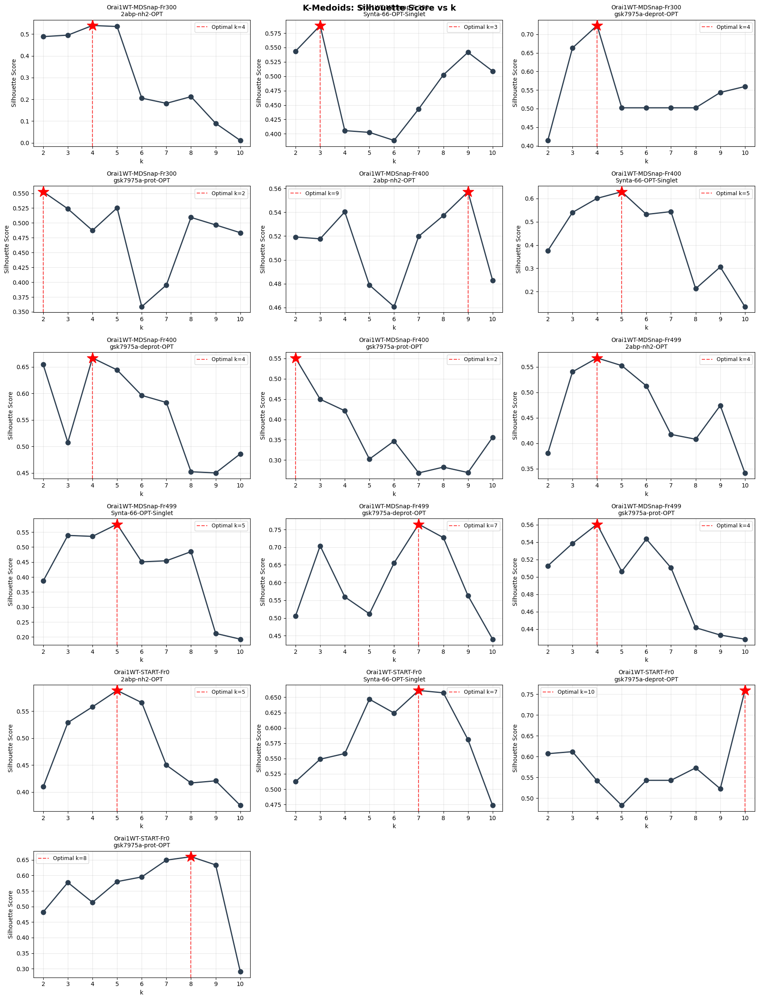

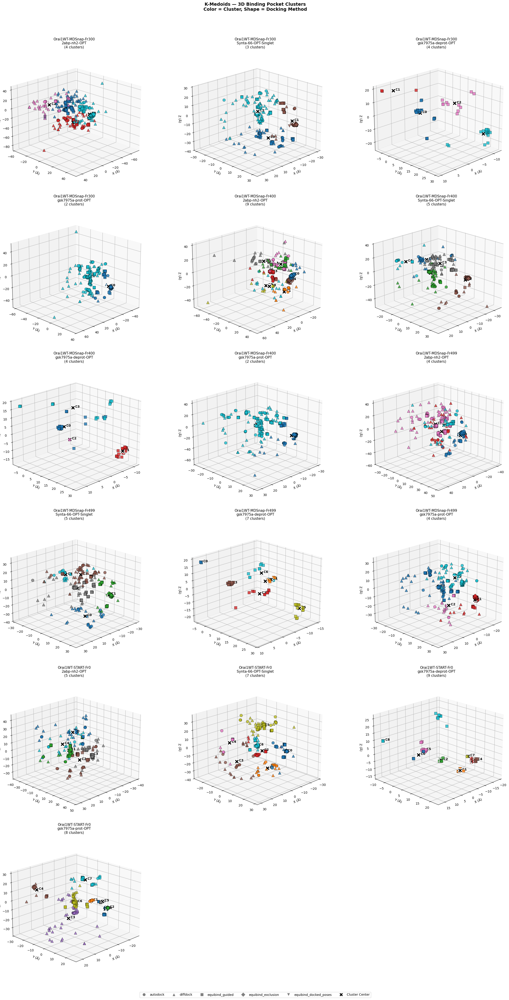

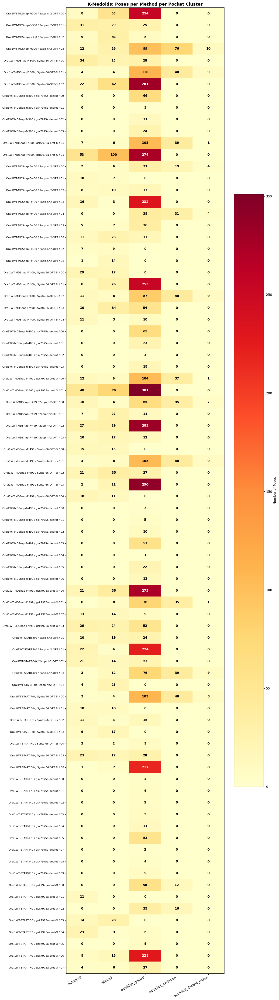


Saved: /home/manndo/master_dev/posebusters_results/clustering_results/clustering_kmedoids_all_poses.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_results/clustering_kmedoids_pockets.csv


In [3]:
"""
K-Medoids Clustering of Binding Pockets
=========================================
"""

# ============================================================================
# K-MEDOIDS FALLBACK
# ============================================================================

class SimpleKMedoids:
    """Simple K-Medoids (PAM-like) fallback implementation."""
    def __init__(self, n_clusters=3, max_iter=300, random_state=42):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state
        self.labels_ = None
        self.cluster_centers_ = None
        self.medoid_indices_ = None
        self.inertia_ = None

    def fit(self, X):
        np.random.seed(self.random_state)
        n_samples = X.shape[0]
        dist_matrix = squareform(pdist(X, metric='euclidean'))
        medoid_indices = np.random.choice(n_samples, self.n_clusters, replace=False)
        for _ in range(self.max_iter):
            labels = np.argmin(dist_matrix[:, medoid_indices], axis=1)
            new_medoid_indices = medoid_indices.copy()
            for k in range(self.n_clusters):
                cluster_indices = np.where(labels == k)[0]
                if len(cluster_indices) == 0:
                    continue
                cluster_dists = dist_matrix[np.ix_(cluster_indices, cluster_indices)]
                best_idx = cluster_indices[np.argmin(cluster_dists.sum(axis=1))]
                new_medoid_indices[k] = best_idx
            if np.array_equal(medoid_indices, new_medoid_indices):
                break
            medoid_indices = new_medoid_indices
        self.medoid_indices_ = medoid_indices
        self.labels_ = np.argmin(dist_matrix[:, medoid_indices], axis=1)
        self.cluster_centers_ = X[medoid_indices]
        self.inertia_ = sum(
            dist_matrix[i, medoid_indices[self.labels_[i]]] for i in range(n_samples)
        )
        return self

    def fit_predict(self, X):
        self.fit(X)
        return self.labels_


def find_optimal_k_kmedoids(coords, k_range, random_state=42):
    """Find optimal k via silhouette score."""
    results = {"k": [], "silhouette": [], "inertia": []}
    for k in k_range:
        if k >= len(coords):
            break
        if KMEDOIDS_AVAILABLE:
            model = KMedoids(n_clusters=k, metric='euclidean',
                             random_state=random_state, method='pam')
        else:
            model = SimpleKMedoids(n_clusters=k, random_state=random_state)
        labels = model.fit_predict(coords)
        inertia = model.inertia_
        sil = silhouette_score(coords, labels) if len(set(labels)) > 1 else -1
        results["k"].append(k)
        results["silhouette"].append(sil)
        results["inertia"].append(inertia)
    best_idx = np.argmax(results["silhouette"])
    results["optimal_k"] = results["k"][best_idx]
    results["best_silhouette"] = results["silhouette"][best_idx]
    return results


# ============================================================================
# K-MEDOIDS: CLUSTER PER PROTEIN-LIGAND COMBINATION
# ============================================================================

if df_poses.empty:
    print("ERROR: No poses available.")
else:
    print("=" * 100)
    print("K-MEDOIDS CLUSTERING OF BINDING POCKETS")
    print("=" * 100)

    df_km = df_poses.copy()
    df_km["cluster_kmedoids"] = -1
    km_cluster_info = {}

    for (protein, ligand), group in df_km.groupby(["protein", "ligand"]):
        combo_key = f"{protein}__{ligand}"
        idx = group.index
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values
        n_poses = len(coords)

        if n_poses < 3:
            df_km.loc[idx, "cluster_kmedoids"] = 0
            km_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        max_k = min(max(K_RANGE), n_poses - 1)
        actual_k_range = range(2, max_k + 1)

        if len(actual_k_range) == 0:
            df_km.loc[idx, "cluster_kmedoids"] = 0
            km_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        km_results = find_optimal_k_kmedoids(coords, actual_k_range,
                                              random_state=RANDOM_STATE)
        k_opt = km_results["optimal_k"]

        if KMEDOIDS_AVAILABLE:
            km_model = KMedoids(n_clusters=k_opt, metric='euclidean',
                                random_state=RANDOM_STATE, method='pam')
        else:
            km_model = SimpleKMedoids(n_clusters=k_opt, random_state=RANDOM_STATE)

        labels = km_model.fit_predict(coords)
        df_km.loc[idx, "cluster_kmedoids"] = labels

        km_cluster_info[combo_key] = {
            "n_poses": n_poses, "optimal_k": k_opt,
            "best_silhouette": km_results["best_silhouette"],
            "search_results": km_results,
        }

    df_km["cluster_kmedoids"] = df_km["cluster_kmedoids"].astype(int)

    # ========================================================================
    # RESULTS
    # ========================================================================

    print(f"\n  {'Protein-Ligand':<55} {'Optimal k':>10} {'Silhouette':>12} {'Poses':>8}")
    print("  " + "-" * 90)
    for combo_key, info in sorted(km_cluster_info.items()):
        print(f"  {combo_key:<55} {info['optimal_k']:>10} "
              f"{info['best_silhouette']:>12.3f} {info['n_poses']:>8}")

    df_km_stats = compute_cluster_stats(df_km, "cluster_kmedoids")
    df_km_overlap = identify_pocket_overlap(df_km_stats)

    print("\n" + "=" * 100)
    print("K-MEDOIDS — Binding Pocket Clusters (poses per method)")
    print("=" * 100)

    km_display_cols = ["protein", "ligand", "cluster_id", "n_poses", "radius_A"] + \
                      METHODS_LIST + ["pocket_type", "n_methods_in_pocket"]
    km_display = df_km_overlap[km_display_cols].sort_values(
        ["protein", "ligand", "cluster_id"])
    print(km_display.to_string(index=False))

    # --- Overlapping vs unique ---
    print("\n" + "=" * 100)
    print("K-MEDOIDS — Overlapping vs Unique Binding Pockets")
    print("=" * 100)

    agg_dict = {"n_poses": ["count", "sum"]}
    for m in METHODS_LIST:
        agg_dict[m] = "sum"
    pocket_summary_km = df_km_overlap.groupby("pocket_type").agg(agg_dict)
    pocket_summary_km.columns = (
        ["N_Clusters", "Total_Poses"] +
        [f"{m}_Poses" for m in METHODS_LIST]
    )
    pocket_summary_km = pocket_summary_km.reset_index()
    print(pocket_summary_km.to_string(index=False))

    # --- Aggregated per protein-ligand ---
    print("\n" + "=" * 100)
    print("K-MEDOIDS — Aggregated per Protein-Ligand")
    print("=" * 100)

    def _agg_func_km(g):
        result = {
            "n_clusters": len(g),
            "overlapping_pockets": (g["pocket_type"] == "Overlapping").sum(),
            "unique_pockets": (g["n_methods_in_pocket"] == 1).sum(),
            "total_poses": g["n_poses"].sum(),
        }
        for m in METHODS_LIST:
            result[f"{m}_in_overlapping"] = g.loc[
                g["pocket_type"] == "Overlapping", m
            ].sum()
        return pd.Series(result)

    agg_km = df_km_overlap.groupby(["protein", "ligand"]).apply(_agg_func_km).reset_index()
    int_cols = [c for c in agg_km.columns if c not in ["protein", "ligand"]]
    for c in int_cols:
        agg_km[c] = agg_km[c].astype(int)
    print(agg_km.to_string(index=False))

    # --- Silhouette score plots ---
    combos_with_search = [(k, v) for k, v in km_cluster_info.items()
                          if v["search_results"] is not None]

    if combos_with_search:
        n_plots = len(combos_with_search)
        n_cols_sil = 3
        n_rows_sil = (n_plots + n_cols_sil - 1) // n_cols_sil
        fig, axes = plt.subplots(n_rows_sil, n_cols_sil,
                                  figsize=(6 * n_cols_sil, 4 * n_rows_sil), squeeze=False)
        fig.suptitle("K-Medoids: Silhouette Score vs k",
                     fontsize=14, fontweight='bold')
        for idx, (combo_key, info) in enumerate(combos_with_search):
            row_i, col_i = divmod(idx, n_cols_sil)
            ax = axes[row_i, col_i]
            sr = info["search_results"]
            ax.plot(sr["k"], sr["silhouette"], 'o-', color='#2c3e50', linewidth=2, markersize=8)
            ax.axvline(x=sr["optimal_k"], color='red', linestyle='--', alpha=0.7,
                       label=f'Optimal k={sr["optimal_k"]}')
            best_i = sr["k"].index(sr["optimal_k"])
            ax.plot(sr["optimal_k"], sr["silhouette"][best_i], '*', color='red',
                    markersize=20, zorder=5)
            ax.set_xlabel("k"); ax.set_ylabel("Silhouette Score")
            ax.set_title(combo_key.replace("__", "\n"), fontsize=10)
            ax.legend(fontsize=9); ax.grid(alpha=0.3); ax.set_xticks(sr["k"])
        for idx in range(n_plots, n_rows_sil * n_cols_sil):
            row_i, col_i = divmod(idx, n_cols_sil)
            axes[row_i, col_i].set_visible(False)
        plt.tight_layout()
        plt.savefig(output_dir / "kmedoids_silhouette_scores.png", dpi=150, bbox_inches='tight')
        plt.show()

    # --- 3D scatter ---
    combo_groups = list(df_km.groupby(["protein", "ligand"]))
    n_combos = len(combo_groups)
    n_cols_3d = 3
    n_rows_3d = (n_combos + n_cols_3d - 1) // n_cols_3d

    fig3d = plt.figure(figsize=(8 * n_cols_3d, 7 * n_rows_3d))
    fig3d.suptitle("K-Medoids — 3D Binding Pocket Clusters\n"
                   "Color = Cluster, Shape = Docking Method",
                   fontsize=14, fontweight='bold', y=1.02)

    for idx, ((protein, ligand), group) in enumerate(combo_groups):
        ax = fig3d.add_subplot(n_rows_3d, n_cols_3d, idx + 1, projection='3d')
        n_cl = group["cluster_kmedoids"].nunique()
        cmap = cm.get_cmap('tab10', max(n_cl, 1))
        for _, row in group.iterrows():
            ax.scatter(row["centroid_x"], row["centroid_y"], row["centroid_z"],
                       c=[cmap(int(row["cluster_kmedoids"]))],
                       marker=METHOD_MARKERS.get(row["method"], "o"),
                       s=80, alpha=0.8, edgecolors='black', linewidth=0.5)
        for c_id in range(n_cl):
            mask = group["cluster_kmedoids"] == c_id
            if mask.sum() > 0:
                center = group.loc[mask, ["centroid_x", "centroid_y", "centroid_z"]].mean()
                ax.scatter(*center, c='black', marker='X', s=200,
                           edgecolors='white', linewidth=2, zorder=10)
                ax.text(center["centroid_x"], center["centroid_y"],
                        center["centroid_z"], f'  C{c_id}', fontsize=10, fontweight='bold')
        ax.set_xlabel("X (Å)"); ax.set_ylabel("Y (Å)"); ax.set_zlabel("Z (Å)")
        ax.set_title(f"{protein}\n{ligand}\n({n_cl} clusters)", fontsize=11)
        ax.view_init(elev=20, azim=45)

    legend_elements = [
        plt.Line2D([0], [0], marker=METHOD_MARKERS[m], color='w',
                   markerfacecolor='gray', markersize=10, label=m)
        for m in METHODS_LIST
    ] + [
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='black',
                   markersize=12, label='Cluster Center'),
    ]
    fig3d.legend(handles=legend_elements, loc='lower center',
                 ncol=min(len(legend_elements), 6),
                 fontsize=10, bbox_to_anchor=(0.5, -0.02))
    plt.tight_layout()
    plt.savefig(output_dir / "kmedoids_3d_clusters.png", dpi=150, bbox_inches='tight')
    plt.show()

    # --- Heatmap ---
    df_heat = df_km_overlap.copy()
    df_heat["pocket_label"] = (df_heat["protein"].str[:20] + " / " +
                                df_heat["ligand"].str[:15] + " / C" +
                                df_heat["cluster_id"].astype(str))
    heat_data = df_heat.set_index("pocket_label")[METHODS_LIST]

    if len(heat_data) > 0:
        n_methods = len(METHODS_LIST)
        fig_h, ax_h = plt.subplots(figsize=(max(6, 2 * n_methods + 2),
                                            max(3, len(heat_data) * 0.5 + 2)))
        im = ax_h.imshow(heat_data.values, cmap='YlOrRd', aspect='auto')
        ax_h.set_xticks(range(n_methods))
        ax_h.set_xticklabels(METHODS_LIST, fontsize=10, rotation=30, ha='right')
        ax_h.set_yticks(range(len(heat_data)))
        ax_h.set_yticklabels(heat_data.index, fontsize=8)
        for i in range(len(heat_data)):
            for j in range(n_methods):
                val = int(heat_data.values[i, j])
                color = 'white' if val > heat_data.values.max() * 0.6 else 'black'
                ax_h.text(j, i, str(val), ha='center', va='center',
                          fontsize=10, fontweight='bold', color=color)
        plt.colorbar(im, ax=ax_h, shrink=0.8).set_label("Number of Poses")
        ax_h.set_title("K-Medoids: Poses per Method per Pocket Cluster",
                        fontsize=13, fontweight='bold')
        plt.tight_layout()
        plt.savefig(output_dir / "kmedoids_heatmap.png", dpi=150, bbox_inches='tight')
        plt.show()

    # --- Save ---
    df_km.to_csv(output_dir / "clustering_kmedoids_all_poses.csv", index=False)
    df_km_overlap.to_csv(output_dir / "clustering_kmedoids_pockets.csv", index=False)
    print(f"\nSaved: {output_dir / 'clustering_kmedoids_all_poses.csv'}")
    print(f"Saved: {output_dir / 'clustering_kmedoids_pockets.csv'}")
    print("=" * 100)

# Hierarchical Clustering

HIERARCHICAL CLUSTERING (WARD CRITERIUM) OF BINDING POCKETS

  Protein-Ligand                                           Optimal k   Silhouette    Poses
  ------------------------------------------------------------------------------------------
  Orai1WT-MDSnap-Fr300__2abp-nh2-OPT                              10        0.633      671
  Orai1WT-MDSnap-Fr300__Synta-66-OPT-Singlet                      10        0.670      617
  Orai1WT-MDSnap-Fr300__gsk7975a-deprot-OPT                       10        0.861      104
  Orai1WT-MDSnap-Fr300__gsk7975a-prot-OPT                         10        0.711      585
  Orai1WT-MDSnap-Fr400__2abp-nh2-OPT                              10        0.649      570
  Orai1WT-MDSnap-Fr400__Synta-66-OPT-Singlet                      10        0.706      601
  Orai1WT-MDSnap-Fr400__gsk7975a-deprot-OPT                       10        0.861      109
  Orai1WT-MDSnap-Fr400__gsk7975a-prot-OPT                         10        0.674      588
  Orai1WT-MDSnap-Fr499__2ab

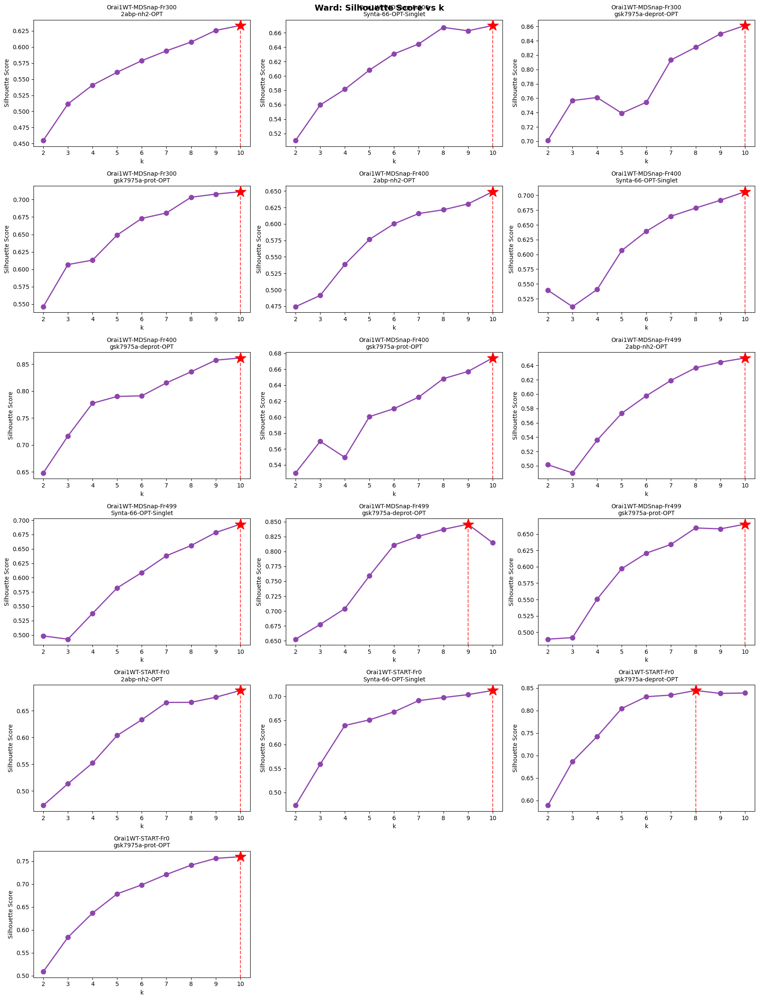

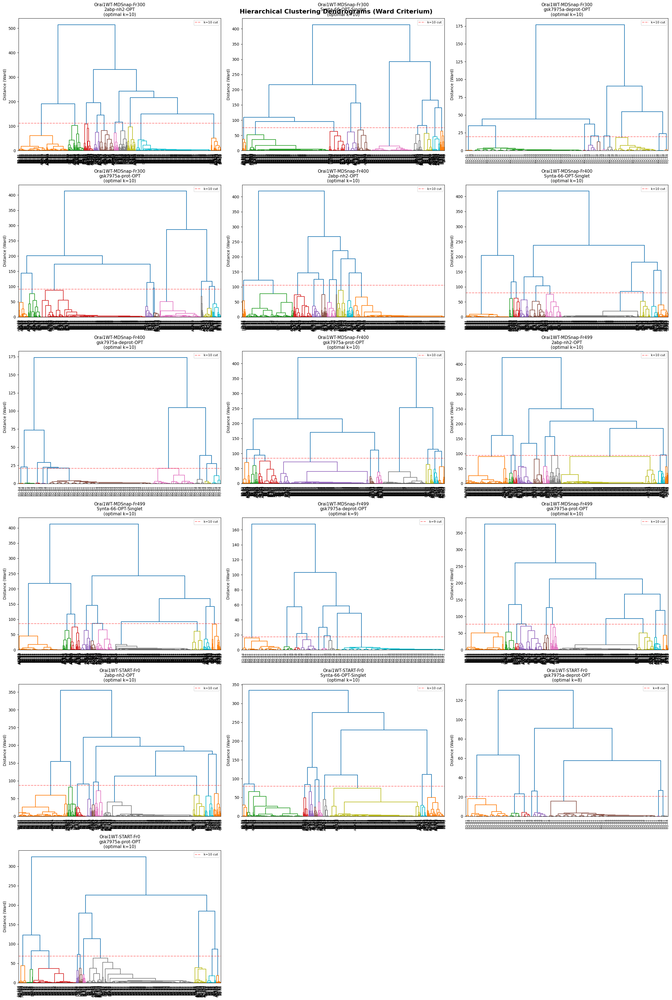

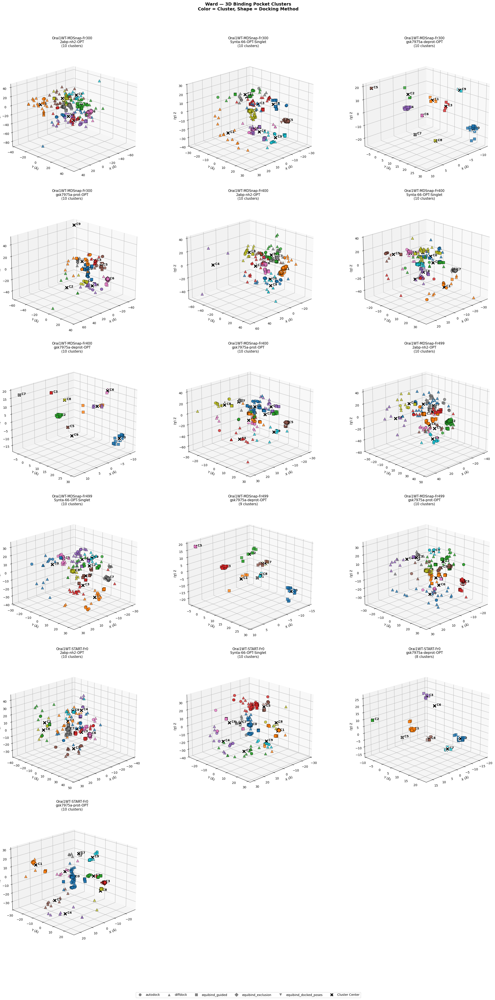

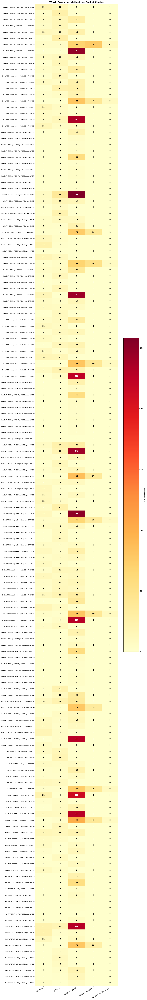


COMPARISON: K-Medoids vs Ward Clustering

  ARI = Adjusted Rand Index (1.0 = identical, 0.0 = random)
  NMI = Normalized Mutual Information (1.0 = identical, 0.0 = independent)

             protein               ligand  n_poses  k_kmedoids  k_ward   ARI   NMI  same_k
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT      671           4      10 0.660 0.688   False
Orai1WT-MDSnap-Fr300 Synta-66-OPT-Singlet      617           3      10 0.544 0.631   False
Orai1WT-MDSnap-Fr300  gsk7975a-deprot-OPT      104           4      10 0.741 0.765   False
Orai1WT-MDSnap-Fr300    gsk7975a-prot-OPT      585           2      10 0.465 0.491   False
Orai1WT-MDSnap-Fr400         2abp-nh2-OPT      570           9      10 0.847 0.816   False
Orai1WT-MDSnap-Fr400 Synta-66-OPT-Singlet      601           5      10 0.693 0.739   False
Orai1WT-MDSnap-Fr400  gsk7975a-deprot-OPT      109           4      10 0.767 0.792   False
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT      588           2      10 0.373 0.454   False
Or

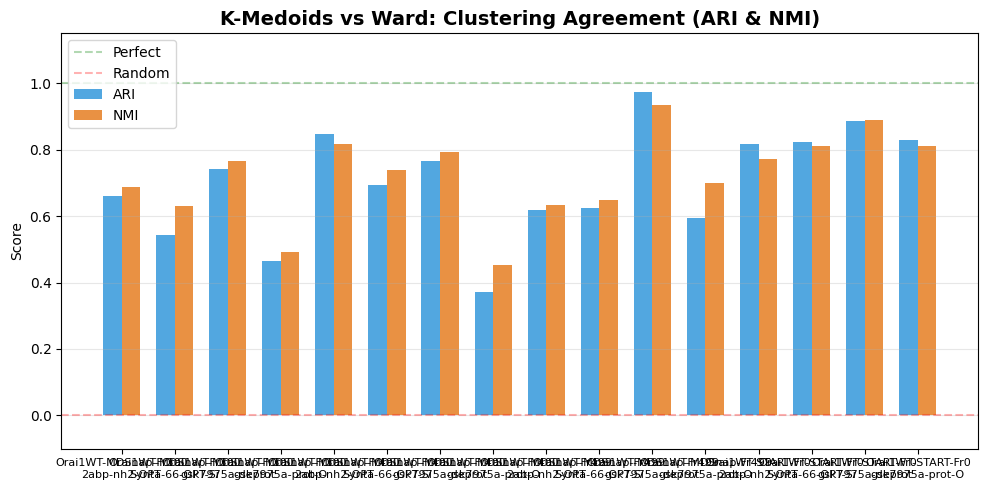


Saved: /home/manndo/master_dev/posebusters_results/clustering_results/clustering_ward_all_poses.csv
Saved: /home/manndo/master_dev/posebusters_results/clustering_results/clustering_ward_pockets.csv


In [4]:
"""
Hierarchical Clustering (Ward Criterium) of Binding Pockets
=============================================================
"""

_ABBREV = {m: m[:2].upper() for m in METHODS_LIST}


def find_optimal_k_ward(coords, k_range):
    """Find optimal k for Ward clustering using silhouette score."""
    results = {"k": [], "silhouette": [], "inertia": []}
    for k in k_range:
        if k >= len(coords):
            break
        model = AgglomerativeClustering(n_clusters=k, linkage='ward')
        labels = model.fit_predict(coords)
        inertia = 0
        for c in range(k):
            mask = labels == c
            if mask.sum() > 0:
                center = coords[mask].mean(axis=0)
                inertia += np.sum((coords[mask] - center) ** 2)
        sil = silhouette_score(coords, labels) if len(set(labels)) > 1 else -1
        results["k"].append(k)
        results["silhouette"].append(sil)
        results["inertia"].append(inertia)
    best_idx = np.argmax(results["silhouette"])
    results["optimal_k"] = results["k"][best_idx]
    results["best_silhouette"] = results["silhouette"][best_idx]
    return results


if df_poses.empty:
    print("ERROR: No poses available.")
else:
    print("=" * 100)
    print("HIERARCHICAL CLUSTERING (WARD CRITERIUM) OF BINDING POCKETS")
    print("=" * 100)

    df_ward = df_poses.copy()
    df_ward["cluster_ward"] = -1
    ward_cluster_info = {}

    for (protein, ligand), group in df_ward.groupby(["protein", "ligand"]):
        combo_key = f"{protein}__{ligand}"
        idx = group.index
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values
        n_poses = len(coords)

        if n_poses < 3:
            df_ward.loc[idx, "cluster_ward"] = 0
            ward_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        max_k = min(max(K_RANGE), n_poses - 1)
        actual_k_range = range(2, max_k + 1)

        if len(actual_k_range) == 0:
            df_ward.loc[idx, "cluster_ward"] = 0
            ward_cluster_info[combo_key] = {
                "n_poses": n_poses, "optimal_k": 1,
                "best_silhouette": -1, "search_results": None,
            }
            continue

        ward_results = find_optimal_k_ward(coords, actual_k_range)
        k_opt = ward_results["optimal_k"]

        ward_model = AgglomerativeClustering(n_clusters=k_opt, linkage='ward')
        labels = ward_model.fit_predict(coords)
        df_ward.loc[idx, "cluster_ward"] = labels

        ward_cluster_info[combo_key] = {
            "n_poses": n_poses, "optimal_k": k_opt,
            "best_silhouette": ward_results["best_silhouette"],
            "search_results": ward_results,
        }

    df_ward["cluster_ward"] = df_ward["cluster_ward"].astype(int)

    # ========================================================================
    # RESULTS
    # ========================================================================

    print(f"\n  {'Protein-Ligand':<55} {'Optimal k':>10} {'Silhouette':>12} {'Poses':>8}")
    print("  " + "-" * 90)
    for combo_key, info in sorted(ward_cluster_info.items()):
        print(f"  {combo_key:<55} {info['optimal_k']:>10} "
              f"{info['best_silhouette']:>12.3f} {info['n_poses']:>8}")

    df_ward_stats = compute_cluster_stats(df_ward, "cluster_ward")
    df_ward_overlap = identify_pocket_overlap(df_ward_stats)

    print("\n" + "=" * 100)
    print("WARD — Binding Pocket Clusters (poses per method)")
    print("=" * 100)

    ward_display_cols = ["protein", "ligand", "cluster_id", "n_poses", "radius_A"] + \
                        METHODS_LIST + ["pocket_type", "n_methods_in_pocket"]
    ward_display = df_ward_overlap[ward_display_cols].sort_values(
        ["protein", "ligand", "cluster_id"])
    print(ward_display.to_string(index=False))

    # --- Overlapping vs unique ---
    print("\n" + "=" * 100)
    print("WARD — Overlapping vs Unique Binding Pockets")
    print("=" * 100)

    agg_dict = {"n_poses": ["count", "sum"]}
    for m in METHODS_LIST:
        agg_dict[m] = "sum"
    pocket_summary_ward = df_ward_overlap.groupby("pocket_type").agg(agg_dict)
    pocket_summary_ward.columns = (
        ["N_Clusters", "Total_Poses"] +
        [f"{m}_Poses" for m in METHODS_LIST]
    )
    pocket_summary_ward = pocket_summary_ward.reset_index()
    print(pocket_summary_ward.to_string(index=False))

    # --- Aggregated per protein-ligand ---
    print("\n" + "=" * 100)
    print("WARD — Aggregated per Protein-Ligand")
    print("=" * 100)

    def _agg_func_ward(g):
        result = {
            "n_clusters": len(g),
            "overlapping_pockets": (g["pocket_type"] == "Overlapping").sum(),
            "unique_pockets": (g["n_methods_in_pocket"] == 1).sum(),
            "total_poses": g["n_poses"].sum(),
        }
        for m in METHODS_LIST:
            result[f"{m}_in_overlapping"] = g.loc[
                g["pocket_type"] == "Overlapping", m
            ].sum()
        return pd.Series(result)

    agg_ward = df_ward_overlap.groupby(["protein", "ligand"]).apply(
        _agg_func_ward).reset_index()
    int_cols = [c for c in agg_ward.columns if c not in ["protein", "ligand"]]
    for c in int_cols:
        agg_ward[c] = agg_ward[c].astype(int)
    print(agg_ward.to_string(index=False))

    # --- Silhouette score plots ---
    combos_with_search = [(k, v) for k, v in ward_cluster_info.items()
                          if v["search_results"] is not None]

    if combos_with_search:
        n_plots = len(combos_with_search)
        n_cols_sil = min(3, n_plots)
        n_rows_sil = math.ceil(n_plots / n_cols_sil)
        fig, axes = plt.subplots(n_rows_sil, n_cols_sil,
                                 figsize=(6 * n_cols_sil, 4 * n_rows_sil), squeeze=False)
        fig.suptitle("Ward: Silhouette Score vs k",
                     fontsize=14, fontweight='bold')
        for idx, (combo_key, info) in enumerate(combos_with_search):
            row_i, col_i = divmod(idx, n_cols_sil)
            ax = axes[row_i, col_i]
            sr = info["search_results"]
            ax.plot(sr["k"], sr["silhouette"], 'o-', color='#8e44ad', linewidth=2, markersize=8)
            ax.axvline(x=sr["optimal_k"], color='red', linestyle='--', alpha=0.7,
                       label=f'Optimal k={sr["optimal_k"]}')
            best_i = sr["k"].index(sr["optimal_k"])
            ax.plot(sr["optimal_k"], sr["silhouette"][best_i], '*', color='red',
                    markersize=20, zorder=5)
            ax.set_xlabel("k"); ax.set_ylabel("Silhouette Score")
            ax.set_title(combo_key.replace("__", "\n"), fontsize=10)
        for idx in range(n_plots, n_rows_sil * n_cols_sil):
            row_i, col_i = divmod(idx, n_cols_sil)
            axes[row_i, col_i].set_visible(False)
        plt.tight_layout()
        plt.savefig(output_dir / "ward_silhouette_scores.png", dpi=150, bbox_inches='tight')

    # --- Dendrograms ---
    combo_groups = list(df_ward.groupby(["protein", "ligand"]))
    n_combos = len(combo_groups)
    n_cols = min(3, n_combos)
    n_rows = math.ceil(n_combos / n_cols)

    fig_dend, axes_d = plt.subplots(n_rows, n_cols,
                                    figsize=(8 * n_cols, 6 * n_rows), squeeze=False)
    fig_dend.suptitle("Hierarchical Clustering Dendrograms (Ward Criterium)",
                      fontsize=16, fontweight='bold')

    for idx, ((protein, ligand), group) in enumerate(combo_groups):
        row_i, col_i = divmod(idx, n_cols)
        ax = axes_d[row_i, col_i]
        coords = group[["centroid_x", "centroid_y", "centroid_z"]].values

        if len(coords) < 2:
            ax.text(0.5, 0.5, "Only 1 pose", transform=ax.transAxes,
                    ha='center', va='center')
            ax.set_title(f"{protein}\n{ligand}")
            continue

        Z = linkage(coords, method='ward')
        labels_dend = []
        for _, row in group.iterrows():
            abbrev = _ABBREV.get(row["method"], "??")
            labels_dend.append(f"{abbrev}-R{row['pose_rank']}")

        combo_key = f"{protein}__{ligand}"
        info = ward_cluster_info.get(combo_key, {})
        k_opt = info.get("optimal_k", 2)

        color_threshold = None
        if k_opt > 1 and len(Z) >= k_opt:
            color_threshold = (Z[-k_opt + 1, 2] + Z[-k_opt, 2]) / 2

        dendrogram(Z, labels=labels_dend, ax=ax, leaf_rotation=90, leaf_font_size=8,
                   color_threshold=color_threshold)
        ax.set_title(f"{protein}\n{ligand}\n(optimal k={k_opt})", fontsize=11)
        ax.set_ylabel("Distance (Ward)")
        if color_threshold is not None:
            ax.axhline(y=color_threshold, color='red', linestyle='--', alpha=0.5,
                       label=f'k={k_opt} cut')
            ax.legend(fontsize=8)

    for idx in range(n_combos, n_rows * n_cols):
        row_i, col_i = divmod(idx, n_cols)
        axes_d[row_i, col_i].set_visible(False)

    plt.tight_layout()
    plt.savefig(output_dir / "ward_dendrograms.png", dpi=150, bbox_inches='tight')
    plt.show()

    # --- 3D scatter ---
    n_cols_3d = min(3, n_combos)
    n_rows_3d = math.ceil(n_combos / n_cols_3d)
    fig3d = plt.figure(figsize=(8 * n_cols_3d, 7 * n_rows_3d))
    fig3d.suptitle("Ward — 3D Binding Pocket Clusters\n"
                   "Color = Cluster, Shape = Docking Method",
                   fontsize=14, fontweight='bold', y=1.02)

    for idx, ((protein, ligand), group) in enumerate(combo_groups):
        ax = fig3d.add_subplot(n_rows_3d, n_cols_3d, idx + 1, projection='3d')
        n_cl = group["cluster_ward"].nunique()
        cmap = cm.get_cmap('tab10', max(n_cl, 1))
        for _, row in group.iterrows():
            ax.scatter(row["centroid_x"], row["centroid_y"], row["centroid_z"],
                       c=[cmap(int(row["cluster_ward"]))],
                       marker=METHOD_MARKERS.get(row["method"], "o"),
                       s=80, alpha=0.8, edgecolors='black', linewidth=0.5)
        for c_id in range(n_cl):
            mask = group["cluster_ward"] == c_id
            if mask.sum() > 0:
                center = group.loc[mask, ["centroid_x", "centroid_y", "centroid_z"]].mean()
                ax.scatter(*center, c='black', marker='X', s=200,
                           edgecolors='white', linewidth=2, zorder=10)
                ax.text(center["centroid_x"], center["centroid_y"],
                        center["centroid_z"], f'  C{c_id}', fontsize=10, fontweight='bold')
        ax.set_xlabel("X (Å)"); ax.set_ylabel("Y (Å)"); ax.set_zlabel("Z (Å)")
        ax.set_title(f"{protein}\n{ligand}\n({n_cl} clusters)", fontsize=11)
        ax.view_init(elev=20, azim=45)

    legend_elements = [
        plt.Line2D([0], [0], marker=METHOD_MARKERS[m], color='w',
                   markerfacecolor='gray', markersize=10, label=m)
        for m in METHODS_LIST
    ] + [
        plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='black',
                   markersize=12, label='Cluster Center'),
    ]
    fig3d.legend(handles=legend_elements, loc='lower center',
                 ncol=min(len(legend_elements), 6),
                 fontsize=10, bbox_to_anchor=(0.5, -0.05))
    plt.tight_layout()
    plt.savefig(output_dir / "ward_3d_clusters.png", dpi=150, bbox_inches='tight')
    plt.show()

    # --- Heatmap ---
    df_heat = df_ward_overlap.copy()
    df_heat["pocket_label"] = (df_heat["protein"].str[:20] + " / " +
                                df_heat["ligand"].str[:15] + " / C" +
                                df_heat["cluster_id"].astype(str))
    heat_data = df_heat.set_index("pocket_label")[METHODS_LIST]
    n_methods = len(METHODS_LIST)

    if len(heat_data) > 0:
        fig_h, ax_h = plt.subplots(figsize=(max(6, 2 * n_methods + 2),
                                            max(3, len(heat_data) * 0.5 + 2)))
        im = ax_h.imshow(heat_data.values, cmap='YlOrRd', aspect='auto')
        ax_h.set_xticks(range(n_methods))
        ax_h.set_xticklabels(METHODS_LIST, fontsize=10, rotation=30, ha='right')
        ax_h.set_yticks(range(len(heat_data)))
        ax_h.set_yticklabels(heat_data.index, fontsize=8)
        for i in range(len(heat_data)):
            for j in range(n_methods):
                val = int(heat_data.values[i, j])
                color = 'white' if val > heat_data.values.max() * 0.6 else 'black'
                ax_h.text(j, i, str(val), ha='center', va='center',
                          fontsize=10, fontweight='bold', color=color)
        plt.colorbar(im, ax=ax_h, shrink=0.8).set_label("Number of Poses")
        ax_h.set_title("Ward: Poses per Method per Pocket Cluster",
                        fontsize=13, fontweight='bold')
        plt.tight_layout()
        plt.savefig(output_dir / "ward_heatmap.png", dpi=150, bbox_inches='tight')
        plt.show()

    # --- Compare with K-Medoids ---
    if 'df_km' in dir() and not df_km.empty:
        print("\n" + "=" * 100)
        print("COMPARISON: K-Medoids vs Ward Clustering")
        print("=" * 100)

        df_combined = df_km[["file_path", "cluster_kmedoids"]].merge(
            df_ward[["file_path", "cluster_ward"]], on="file_path"
        )
        df_combined = df_poses.merge(df_combined, on="file_path")

        comparison = []
        for (protein, ligand), group in df_combined.groupby(["protein", "ligand"]):
            lkm = group["cluster_kmedoids"].values
            lw = group["cluster_ward"].values
            if len(set(lkm)) < 2 or len(set(lw)) < 2:
                ari = 1.0 if np.array_equal(lkm, lw) else 0.0
                nmi = 1.0 if np.array_equal(lkm, lw) else 0.0
            else:
                ari = adjusted_rand_score(lkm, lw)
                nmi = normalized_mutual_info_score(lkm, lw)
            comparison.append({
                "protein": protein, "ligand": ligand, "n_poses": len(group),
                "k_kmedoids": len(set(lkm)), "k_ward": len(set(lw)),
                "ARI": round(ari, 3), "NMI": round(nmi, 3),
                "same_k": len(set(lkm)) == len(set(lw)),
            })

        df_comparison = pd.DataFrame(comparison)
        print("\n  ARI = Adjusted Rand Index (1.0 = identical, 0.0 = random)")
        print("  NMI = Normalized Mutual Information (1.0 = identical, 0.0 = independent)\n")
        print(df_comparison.to_string(index=False))
        print(f"\n  Mean ARI: {df_comparison['ARI'].mean():.3f}")
        print(f"  Mean NMI: {df_comparison['NMI'].mean():.3f}")
        n_same = df_comparison['same_k'].sum()
        print(f"  Same k:   {n_same}/{len(df_comparison)} "
              f"({100*n_same/len(df_comparison):.1f}%)")

        # ARI/NMI bar chart
        fig_c, ax_c = plt.subplots(figsize=(10, 5))
        x = np.arange(len(df_comparison))
        w = 0.35
        ax_c.bar(x - w/2, df_comparison["ARI"], w, label="ARI", color="#3498db", alpha=0.85)
        ax_c.bar(x + w/2, df_comparison["NMI"], w, label="NMI", color="#e67e22", alpha=0.85)
        ax_c.axhline(y=1.0, color='green', linestyle='--', alpha=0.3, label='Perfect')
        ax_c.axhline(y=0.0, color='red', linestyle='--', alpha=0.3, label='Random')
        combo_labels = [f"{r['protein'][:20]}\n{r['ligand'][:15]}"
                        for _, r in df_comparison.iterrows()]
        ax_c.set_xticks(x)
        ax_c.set_xticklabels(combo_labels, fontsize=8)
        ax_c.set_ylabel("Score")
        ax_c.set_title("K-Medoids vs Ward: Clustering Agreement (ARI & NMI)",
                        fontsize=14, fontweight='bold')
        ax_c.legend(); ax_c.grid(axis='y', alpha=0.3); ax_c.set_ylim(-0.1, 1.15)
        plt.tight_layout()
        plt.savefig(output_dir / "clustering_agreement_ari_nmi.png", dpi=150, bbox_inches='tight')
        plt.show()
        df_comparison.to_csv(output_dir / "clustering_comparison.csv", index=False)

    # --- Save ---
    df_ward.to_csv(output_dir / "clustering_ward_all_poses.csv", index=False)
    df_ward_overlap.to_csv(output_dir / "clustering_ward_pockets.csv", index=False)
    print(f"\nSaved: {output_dir / 'clustering_ward_all_poses.csv'}")
    print(f"Saved: {output_dir / 'clustering_ward_pockets.csv'}")
    print("=" * 100)

# Conformity vs Diversity Analysis


CONFORMITY SCORES FOR ALL PROTEIN-LIGAND COMBINATIONS
             protein               ligand  n_poses  n_methods  n_clusters  overlapping_clusters  overlap_fraction  mean_inter_method_dist  spatial_spread  conformity_score
   Orai1WT-START-Fr0 Synta-66-OPT-Singlet      547          5          10                    10             1.000                   14.98           15.01            0.7100
   Orai1WT-START-Fr0         2abp-nh2-OPT      527          5          10                    10             1.000                   15.49           15.90            0.7010
Orai1WT-MDSnap-Fr499    gsk7975a-prot-OPT      592          5          10                    10             1.000                   18.71           16.04            0.6808
Orai1WT-MDSnap-Fr400 Synta-66-OPT-Singlet      601          5          10                    10             1.000                   18.32           16.61            0.6793
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT      588          5          10            

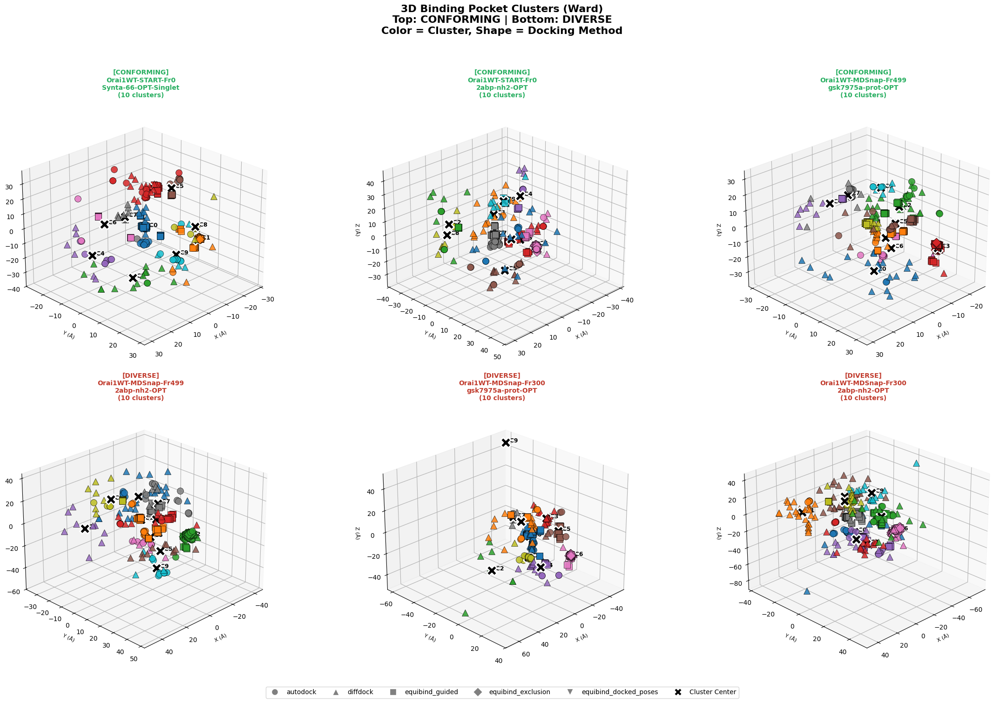


RMSD COMPARISON TABLE
             protein               ligand   category  cluster_id              method_1              method_2  n_poses_m1  n_poses_m2  mean_rmsd  median_rmsd  min_rmsd  max_rmsd  std_rmsd
   Orai1WT-START-Fr0 Synta-66-OPT-Singlet CONFORMING           0              autodock              diffdock           5           5      14.21        15.93      6.58     20.96      5.33
   Orai1WT-START-Fr0 Synta-66-OPT-Singlet CONFORMING           0              autodock       equibind_guided           5           5      11.07        11.19      7.76     16.29      2.69
   Orai1WT-START-Fr0 Synta-66-OPT-Singlet CONFORMING           0              diffdock       equibind_guided           5           5       9.48         8.39      2.07     19.77      5.06
   Orai1WT-START-Fr0 Synta-66-OPT-Singlet CONFORMING           0              autodock              autodock           5           5       2.93         2.78      2.12      3.54      0.47
   Orai1WT-START-Fr0 Synta-66-OPT-Singlet 

In [5]:
"""
Conformity vs Diversity Analysis
==================================
"""

from rdkit.Chem import rdMolAlign
from scipy.spatial.distance import cdist
from itertools import product
import matplotlib.gridspec as gridspec

N_BALANCED_POSES = 5
TOOL_ABBREV = {m: m[:2].upper() for m in METHODS_LIST}


def load_mol_from_sdf(sdf_path):
    try:
        mol = Chem.MolFromMolFile(str(sdf_path), removeHs=False, sanitize=False)
        if mol is not None and mol.GetNumConformers() > 0:
            return mol
    except Exception:
        pass
    return None


def get_heavy_atom_coords(sdf_path):
    try:
        mol = Chem.MolFromMolFile(str(sdf_path), removeHs=True, sanitize=False)
        if mol is None:
            mol = Chem.MolFromMolFile(str(sdf_path), removeHs=False, sanitize=False)
            if mol is not None:
                mol = Chem.RemoveHs(mol)
        if mol is None or mol.GetNumConformers() == 0:
            return None
        conf = mol.GetConformer()
        return np.array([
            [conf.GetAtomPosition(i).x, conf.GetAtomPosition(i).y, conf.GetAtomPosition(i).z]
            for i in range(mol.GetNumAtoms())
        ])
    except Exception:
        return None


def compute_centroid_rmsd(coords1, coords2):
    if coords1 is None or coords2 is None:
        return np.nan
    if len(coords1) == len(coords2):
        c1 = coords1 - coords1.mean(axis=0)
        c2 = coords2 - coords2.mean(axis=0)
        diff = c1 - c2
        return np.sqrt(np.mean(np.sum(diff ** 2, axis=1)))
    else:
        return np.linalg.norm(coords1.mean(axis=0) - coords2.mean(axis=0))


def compute_rdkit_rmsd(mol1, mol2):
    try:
        if mol1 is None or mol2 is None:
            return np.nan
        m1 = Chem.RemoveHs(mol1)
        m2 = Chem.RemoveHs(mol2)
        if m1.GetNumAtoms() != m2.GetNumAtoms():
            c1 = m1.GetConformer(); c2 = m2.GetConformer()
            coords1 = np.array([[c1.GetAtomPosition(i).x, c1.GetAtomPosition(i).y,
                                 c1.GetAtomPosition(i).z] for i in range(m1.GetNumAtoms())])
            coords2 = np.array([[c2.GetAtomPosition(i).x, c2.GetAtomPosition(i).y,
                                 c2.GetAtomPosition(i).z] for i in range(m2.GetNumAtoms())])
            return np.linalg.norm(coords1.mean(axis=0) - coords2.mean(axis=0))
        return rdMolAlign.GetBestRMS(m1, m2)
    except Exception:
        return np.nan


def score_conformity(group_df, cluster_col):
    n_clusters = group_df[cluster_col].nunique()
    n_methods = group_df["method"].nunique()
    n_poses = len(group_df)

    overlapping_clusters = 0
    total_overlap_poses = 0
    for c_id, c_group in group_df.groupby(cluster_col):
        methods_in_cluster = c_group["method"].nunique()
        if methods_in_cluster >= 2:
            overlapping_clusters += 1
            total_overlap_poses += len(c_group)

    overlap_fraction = total_overlap_poses / n_poses if n_poses > 0 else 0

    method_centroids = {}
    for method, m_group in group_df.groupby("method"):
        coords = m_group[["centroid_x", "centroid_y", "centroid_z"]].values
        method_centroids[method] = coords.mean(axis=0)

    inter_method_dist = []
    for (m1, c1), (m2, c2) in combinations(method_centroids.items(), 2):
        inter_method_dist.append(np.linalg.norm(c1 - c2))
    mean_inter_method_dist = np.mean(inter_method_dist) if inter_method_dist else 0

    all_coords = group_df[["centroid_x", "centroid_y", "centroid_z"]].values
    global_centroid = all_coords.mean(axis=0)
    spread = np.mean(np.linalg.norm(all_coords - global_centroid, axis=1))

    conformity_score = (
        overlap_fraction * 0.4 +
        max(0, 1 - mean_inter_method_dist / 50) * 0.3 +
        max(0, 1 - spread / 30) * 0.2 +
        max(0, 1 - n_clusters / 10) * 0.1
    )

    return {
        "n_clusters": n_clusters,
        "n_methods": n_methods,
        "n_poses": n_poses,
        "overlapping_clusters": overlapping_clusters,
        "overlap_fraction": round(overlap_fraction, 3),
        "mean_inter_method_dist": round(mean_inter_method_dist, 2),
        "spatial_spread": round(spread, 2),
        "conformity_score": round(conformity_score, 4),
    }


# --- Score all protein-ligand combinations ---
if 'df_ward' in dir() and not df_ward.empty:
    df_analysis = df_ward.copy()
    cluster_col = "cluster_ward"
    clustering_label = "Ward"
elif 'df_km' in dir() and not df_km.empty:
    df_analysis = df_km.copy()
    cluster_col = "cluster_kmedoids"
    clustering_label = "K-Medoids"
else:
    raise RuntimeError("No clustering results found.")

combo_scores = []
for (protein, ligand), group in df_analysis.groupby(["protein", "ligand"]):
    n_methods = group["method"].nunique()
    if n_methods < 2:
        continue
    scores = score_conformity(group, cluster_col)
    scores["protein"] = protein
    scores["ligand"] = ligand
    combo_scores.append(scores)

df_scores = pd.DataFrame(combo_scores).sort_values("conformity_score", ascending=False)

print("\n" + "=" * 120)
print("CONFORMITY SCORES FOR ALL PROTEIN-LIGAND COMBINATIONS")
print("=" * 120)
print(df_scores[[
    "protein", "ligand", "n_poses", "n_methods", "n_clusters",
    "overlapping_clusters", "overlap_fraction",
    "mean_inter_method_dist", "spatial_spread", "conformity_score"
]].to_string(index=False))

# --- Select top conforming & diverse ---
n_available = len(df_scores)
n_conform = min(3, n_available // 2) if n_available >= 2 else min(1, n_available)
n_diverse = min(3, n_available - n_conform)

top_conform = df_scores.head(n_conform)
top_diverse = df_scores.tail(n_diverse)

diverse_keys = set(zip(top_diverse["protein"], top_diverse["ligand"]))
conform_keys = set(zip(top_conform["protein"], top_conform["ligand"]))
if diverse_keys & conform_keys:
    remaining = df_scores[~df_scores.apply(
        lambda r: (r["protein"], r["ligand"]) in conform_keys, axis=1)]
    top_diverse = remaining.tail(n_diverse)

print(f"\nSELECTED — TOP {n_conform} CONFORMING:")
for _, row in top_conform.iterrows():
    print(f"  {row['protein']} + {row['ligand']} (score={row['conformity_score']:.4f})")
print(f"\nSELECTED — TOP {n_diverse} DIVERSE:")
for _, row in top_diverse.iterrows():
    print(f"  {row['protein']} + {row['ligand']} (score={row['conformity_score']:.4f})")

selected_conform = list(zip(top_conform["protein"], top_conform["ligand"]))
selected_diverse = list(zip(top_diverse["protein"], top_diverse["ligand"]))
all_selected = selected_conform + selected_diverse
category_map = {}
for p, l in selected_conform:
    category_map[(p, l)] = "CONFORMING"
for p, l in selected_diverse:
    category_map[(p, l)] = "DIVERSE"

# --- 3D Scatter Plots ---
n_selected = len(all_selected)
if n_selected > 0:
    fig_3d = plt.figure(figsize=(8 * min(n_selected, 3), 7 * ((n_selected + 2) // 3)))
    fig_3d.suptitle(
        f"3D Binding Pocket Clusters ({clustering_label})\n"
        "Top: CONFORMING | Bottom: DIVERSE\n"
        "Color = Cluster, Shape = Docking Method",
        fontsize=16, fontweight='bold', y=1.03
    )

    for plot_idx, (protein, ligand) in enumerate(all_selected):
        group = df_analysis[
            (df_analysis["protein"] == protein) & (df_analysis["ligand"] == ligand)
        ]
        category = category_map[(protein, ligand)]
        ax = fig_3d.add_subplot(
            (n_selected + 2) // 3, min(n_selected, 3), plot_idx + 1, projection='3d'
        )
        n_cl = group[cluster_col].nunique()
        cmap_clusters = cm.get_cmap('tab10', max(n_cl, 1))
        for _, row in group.iterrows():
            c_id = int(row[cluster_col])
            method = row["method"]
            ax.scatter(row["centroid_x"], row["centroid_y"], row["centroid_z"],
                       c=[cmap_clusters(c_id)],
                       marker=METHOD_MARKERS.get(method, "o"),
                       s=100, alpha=0.85, edgecolors='black', linewidth=0.5)
        for c_id in group[cluster_col].unique():
            mask = group[cluster_col] == c_id
            if mask.sum() > 0:
                center = group.loc[mask, ["centroid_x", "centroid_y", "centroid_z"]].mean()
                ax.scatter(center["centroid_x"], center["centroid_y"], center["centroid_z"],
                           c='black', marker='X', s=250, edgecolors='white', linewidth=2, zorder=10)
                ax.text(center["centroid_x"], center["centroid_y"], center["centroid_z"],
                        f'  C{c_id}', fontsize=9, fontweight='bold', color='black')
        badge_color = '#27ae60' if category == "CONFORMING" else '#c0392b'
        ax.set_title(f"[{category}]\n{protein}\n{ligand}\n({n_cl} clusters)",
                     fontsize=10, fontweight='bold', color=badge_color)
        ax.set_xlabel("X (Å)", fontsize=8); ax.set_ylabel("Y (Å)", fontsize=8)
        ax.set_zlabel("Z (Å)", fontsize=8); ax.view_init(elev=25, azim=45)

    legend_elements = [
        plt.Line2D([0], [0], marker=METHOD_MARKERS[m], color='w',
                   markerfacecolor='gray', markersize=10, label=m)
        for m in METHODS_LIST
    ] + [plt.Line2D([0], [0], marker='X', color='w', markerfacecolor='black',
                    markersize=12, label='Cluster Center')]
    fig_3d.legend(handles=legend_elements, loc='lower center',
                  ncol=min(len(legend_elements), 6), fontsize=10, bbox_to_anchor=(0.5, -0.04))
    plt.tight_layout()
    plt.savefig(output_dir / "selected_3d_clusters.png", dpi=150, bbox_inches='tight')
    plt.show()

# --- Balanced RMSD Comparison ---
all_rmsd_records = []

for (protein, ligand) in all_selected:
    category = category_map[(protein, ligand)]
    group = df_analysis[
        (df_analysis["protein"] == protein) & (df_analysis["ligand"] == ligand)
    ]
    for c_id, c_group in group.groupby(cluster_col):
        method_poses = {}
        for method in METHODS_LIST:
            m_group = c_group[c_group["method"] == method]
            if len(m_group) == 0:
                continue
            m_sorted = m_group.sort_values("pose_rank")
            sampled = m_sorted.head(N_BALANCED_POSES)
            pose_coords = []
            pose_files = []
            for _, row in sampled.iterrows():
                coords = get_heavy_atom_coords(row["file_path"])
                if coords is not None:
                    pose_coords.append(coords)
                    pose_files.append(row["file_path"])
            if pose_coords:
                method_poses[method] = {"coords": pose_coords, "files": pose_files,
                                        "n_used": len(pose_coords)}

        available_methods = sorted(method_poses.keys())
        if len(available_methods) < 2:
            continue
        min_n = min(method_poses[m]["n_used"] for m in available_methods)

        for m1, m2 in combinations(available_methods, 2):
            coords1_list = method_poses[m1]["coords"][:min_n]
            coords2_list = method_poses[m2]["coords"][:min_n]
            pairwise_rmsds = []
            for c1 in coords1_list:
                for c2 in coords2_list:
                    r = compute_centroid_rmsd(c1, c2)
                    if not np.isnan(r):
                        pairwise_rmsds.append(r)
            if pairwise_rmsds:
                all_rmsd_records.append({
                    "protein": protein, "ligand": ligand, "category": category,
                    "cluster_id": c_id, "method_1": m1, "method_2": m2,
                    "n_poses_m1": len(coords1_list), "n_poses_m2": len(coords2_list),
                    "mean_rmsd": round(np.mean(pairwise_rmsds), 2),
                    "median_rmsd": round(np.median(pairwise_rmsds), 2),
                    "min_rmsd": round(np.min(pairwise_rmsds), 2),
                    "max_rmsd": round(np.max(pairwise_rmsds), 2),
                    "std_rmsd": round(np.std(pairwise_rmsds), 2),
                })

        for method in available_methods:
            coords_list = method_poses[method]["coords"][:min_n]
            if len(coords_list) < 2:
                continue
            intra_rmsds = []
            for c1, c2 in combinations(coords_list, 2):
                r = compute_centroid_rmsd(c1, c2)
                if not np.isnan(r):
                    intra_rmsds.append(r)
            if intra_rmsds:
                all_rmsd_records.append({
                    "protein": protein, "ligand": ligand, "category": category,
                    "cluster_id": c_id, "method_1": method, "method_2": method,
                    "n_poses_m1": len(coords_list), "n_poses_m2": len(coords_list),
                    "mean_rmsd": round(np.mean(intra_rmsds), 2),
                    "median_rmsd": round(np.median(intra_rmsds), 2),
                    "min_rmsd": round(np.min(intra_rmsds), 2),
                    "max_rmsd": round(np.max(intra_rmsds), 2),
                    "std_rmsd": round(np.std(intra_rmsds), 2),
                })

df_rmsd = pd.DataFrame(all_rmsd_records)

if not df_rmsd.empty:
    print("\n" + "=" * 120)
    print("RMSD COMPARISON TABLE")
    print("=" * 120)
    print(df_rmsd.to_string(index=False))
    df_rmsd.to_csv(output_dir / "selected_rmsd_comparison.csv", index=False)
    df_scores.to_csv(output_dir / "conformity_scores_all.csv", index=False)
    print(f"\nSaved: {output_dir / 'selected_rmsd_comparison.csv'}")
    print(f"Saved: {output_dir / 'conformity_scores_all.csv'}")
else:
    print("\nWARNING: No RMSD data could be computed.")

# Summary
print("\n" + "=" * 120)
print("SUMMARY")
print("=" * 120)
print(f"  Clustering method: {clustering_label}")
print(f"  Total combos scored: {len(df_scores)}")
print(f"  Selected conforming: {len(selected_conform)}")
print(f"  Selected diverse: {len(selected_diverse)}")
if not df_rmsd.empty:
    conform_rmsd = df_rmsd[
        (df_rmsd["category"] == "CONFORMING") & (df_rmsd["method_1"] != df_rmsd["method_2"])
    ]["mean_rmsd"]
    diverse_rmsd = df_rmsd[
        (df_rmsd["category"] == "DIVERSE") & (df_rmsd["method_1"] != df_rmsd["method_2"])
    ]["mean_rmsd"]
    if not conform_rmsd.empty:
        print(f"  CONFORMING RMSD: mean={conform_rmsd.mean():.2f} Å, median={conform_rmsd.median():.2f} Å")
    if not diverse_rmsd.empty:
        print(f"  DIVERSE RMSD:    mean={diverse_rmsd.mean():.2f} Å, median={diverse_rmsd.median():.2f} Å")
print("=" * 120)

# Cluster Conformity — Closest-Pose RMSD

In [6]:
"""
Cluster Composition & Closest-Pose Inter-Method RMSD
=====================================================
"""

TOOL_ABBREV = {m: m[:2].upper() for m in METHODS_LIST}


def _load_heavy_coords(sdf_path):
    try:
        mol = Chem.MolFromMolFile(str(sdf_path), removeHs=True, sanitize=False)
        if mol is None:
            mol = Chem.MolFromMolFile(str(sdf_path), removeHs=False, sanitize=False)
            if mol is not None:
                mol = Chem.RemoveHs(mol)
        if mol is None or mol.GetNumConformers() == 0:
            return None
        conf = mol.GetConformer()
        return np.array([
            [conf.GetAtomPosition(i).x, conf.GetAtomPosition(i).y, conf.GetAtomPosition(i).z]
            for i in range(mol.GetNumAtoms())
        ])
    except Exception:
        return None


def _rmsd(c1, c2):
    if c1 is None or c2 is None:
        return np.nan
    if len(c1) == len(c2):
        d = c1 - c2
        return float(np.sqrt(np.mean(np.sum(d ** 2, axis=1))))
    return float(np.linalg.norm(c1.mean(axis=0) - c2.mean(axis=0)))


# Select data source
if 'df_ward' in dir() and not df_ward.empty:
    df_src = df_ward.copy()
    clust_col = "cluster_ward"
    clust_name = "Ward"
elif 'df_km' in dir() and not df_km.empty:
    df_src = df_km.copy()
    clust_col = "cluster_kmedoids"
    clust_name = "K-Medoids"
else:
    raise RuntimeError("No clustering results found.")

print(f"Using {clust_name} clustering  ({clust_col})")
print(f"Total poses: {len(df_src)}")

combo_list = sorted(df_src.groupby(["protein", "ligand"]).groups.keys())
print(f"Protein-ligand combinations: {len(combo_list)}")

# --- Cluster overview ---
print("\n" + "=" * 120)
print("CLUSTER OVERVIEW PER PROTEIN-LIGAND COMBINATION")
print("=" * 120)

overview_rows = []
for protein, ligand in combo_list:
    grp = df_src[(df_src["protein"] == protein) & (df_src["ligand"] == ligand)]
    cluster_ids = sorted(grp[clust_col].unique())
    n_clusters = len(cluster_ids)
    for cid in cluster_ids:
        c_grp = grp[grp[clust_col] == cid]
        method_counts = {m: int((c_grp["method"] == m).sum()) for m in METHODS_LIST}
        overview_rows.append({
            "protein": protein, "ligand": ligand, "n_clusters": n_clusters,
            "cluster": cid, "total_poses": len(c_grp),
            **{TOOL_ABBREV[m]: method_counts[m] for m in METHODS_LIST},
            "methods_present": ", ".join(
                TOOL_ABBREV[m] for m in METHODS_LIST if method_counts[m] > 0),
        })

df_overview = pd.DataFrame(overview_rows)
print(df_overview.to_string(index=False))

# --- Closest-pose RMSD ---
print("\n" + "=" * 120)
print("CLOSEST-POSE RMSD BETWEEN DOCKING METHODS  (balanced, per cluster)")
print("=" * 120)

rmsd_records = []
detail_records = []

for protein, ligand in combo_list:
    grp = df_src[(df_src["protein"] == protein) & (df_src["ligand"] == ligand)]
    cluster_ids = sorted(grp[clust_col].unique())

    for cid in cluster_ids:
        c_grp = grp[grp[clust_col] == cid]
        method_data = {}
        for meth in METHODS_LIST:
            m_sub = c_grp[c_grp["method"] == meth].sort_values("pose_rank")
            coords = []
            for _, rw in m_sub.iterrows():
                c = _load_heavy_coords(rw["file_path"])
                if c is not None:
                    coords.append(c)
            if coords:
                method_data[meth] = coords

        active_methods = sorted(method_data.keys())
        if len(active_methods) < 2:
            continue
        min_n = min(len(method_data[m]) for m in active_methods)
        if min_n == 0:
            continue
        for m in active_methods:
            method_data[m] = method_data[m][:min_n]

        for t1, t2 in combinations(active_methods, 2):
            pair_label = f"{TOOL_ABBREV[t1]} vs {TOOL_ABBREV[t2]}"
            all_rmsds = []
            for i, c1 in enumerate(method_data[t1]):
                for j, c2 in enumerate(method_data[t2]):
                    r = _rmsd(c1, c2)
                    if not np.isnan(r):
                        all_rmsds.append(r)
                        detail_records.append({
                            "protein": protein, "ligand": ligand,
                            "cluster": cid, "pair": pair_label,
                            "pose_i": f"{TOOL_ABBREV[t1]}-{i+1}",
                            "pose_j": f"{TOOL_ABBREV[t2]}-{j+1}",
                            "rmsd": round(r, 3),
                        })
            if all_rmsds:
                rmsd_records.append({
                    "protein": protein, "ligand": ligand, "cluster": cid,
                    "pair": pair_label, "n_poses_per_method": min_n,
                    "n_comparisons": len(all_rmsds),
                    "closest_rmsd": round(np.min(all_rmsds), 3),
                    "mean_rmsd": round(np.mean(all_rmsds), 3),
                    "median_rmsd": round(np.median(all_rmsds), 3),
                    "max_rmsd": round(np.max(all_rmsds), 3),
                    "std_rmsd": round(np.std(all_rmsds), 3),
                })

df_rmsd = pd.DataFrame(rmsd_records)
df_detail = pd.DataFrame(detail_records)

if df_rmsd.empty:
    print("\nNo clusters with >= 2 docking methods found.")
else:
    print(f"\nTotal method-pair RMSD rows: {len(df_rmsd)}")
    display_cols = [
        "protein", "ligand", "cluster", "pair",
        "n_poses_per_method", "closest_rmsd",
        "mean_rmsd", "median_rmsd", "max_rmsd", "std_rmsd",
    ]
    print(df_rmsd[display_cols].to_string(index=False))

    # Save
    df_overview.to_csv(output_dir / "cluster_overview.csv", index=False)
    df_rmsd.to_csv(output_dir / "closest_rmsd_per_cluster.csv", index=False)
    df_detail.to_csv(output_dir / "pairwise_rmsd_detail.csv", index=False)
    print(f"\nSaved: {output_dir / 'cluster_overview.csv'}")
    print(f"Saved: {output_dir / 'closest_rmsd_per_cluster.csv'}")
    print(f"Saved: {output_dir / 'pairwise_rmsd_detail.csv'}")

Using Ward clustering  (cluster_ward)
Total poses: 7399
Protein-ligand combinations: 16

CLUSTER OVERVIEW PER PROTEIN-LIGAND COMBINATION
             protein               ligand  n_clusters  cluster  total_poses  AU  DI  EQ    methods_present
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT          10        0           32  19  13   0             AU, DI
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT          10        1           29   4  25   0             AU, DI
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT          10        2           53   7  15   0         AU, DI, EQ
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT          10        3           20   5  15   0             AU, DI
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT          10        4           48  12  11   0         AU, DI, EQ
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT          10        5           28   0  28   0                 DI
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT          10        6          164   5   5  10 AU, DI, EQ, EQ, EQ
Orai1WT

# K-Medoids vs Ward Comparison

STEP 1 — CLUSTER COUNT OVERVIEW
             protein               ligand  n_poses  k_kmedoids  k_ward same_k
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT      671           4      10     No
Orai1WT-MDSnap-Fr300 Synta-66-OPT-Singlet      617           3      10     No
Orai1WT-MDSnap-Fr300  gsk7975a-deprot-OPT      104           4      10     No
Orai1WT-MDSnap-Fr300    gsk7975a-prot-OPT      585           2      10     No
Orai1WT-MDSnap-Fr400         2abp-nh2-OPT      570           9      10     No
Orai1WT-MDSnap-Fr400 Synta-66-OPT-Singlet      601           5      10     No
Orai1WT-MDSnap-Fr400  gsk7975a-deprot-OPT      109           4      10     No
Orai1WT-MDSnap-Fr400    gsk7975a-prot-OPT      588           2      10     No
Orai1WT-MDSnap-Fr499         2abp-nh2-OPT      552           4      10     No
Orai1WT-MDSnap-Fr499 Synta-66-OPT-Singlet      619           5      10     No
Orai1WT-MDSnap-Fr499  gsk7975a-deprot-OPT      111           7       9     No
Orai1WT-MDSnap-Fr499    gsk7975a

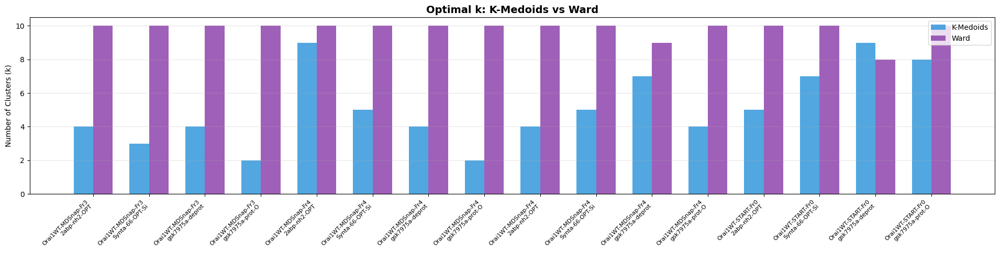


STEP 5 — RMSD FOR TOP-3 RANKED POSES IN MULTI-TOOL CLUSTERS
clustering              protein               ligand  cluster_id tool_1 tool_2  n_poses_each  type  mean_rmsd  min_rmsd  max_rmsd
 K-Medoids Orai1WT-MDSnap-Fr300         2abp-nh2-OPT           0     AU     DI             3 inter       0.81      0.69      0.91
 K-Medoids Orai1WT-MDSnap-Fr300         2abp-nh2-OPT           0     AU     EQ             3 inter       1.09      0.65      1.45
 K-Medoids Orai1WT-MDSnap-Fr300         2abp-nh2-OPT           0     DI     EQ             3 inter       1.20      0.63      1.49
 K-Medoids Orai1WT-MDSnap-Fr300         2abp-nh2-OPT           0     AU     AU             3 intra       0.99      0.88      1.14
 K-Medoids Orai1WT-MDSnap-Fr300         2abp-nh2-OPT           0     DI     DI             3 intra       0.70      0.28      0.94
 K-Medoids Orai1WT-MDSnap-Fr300         2abp-nh2-OPT           0     EQ     EQ             3 intra       1.10      0.87      1.34
 K-Medoids Orai1WT-MDSnap-Fr3

In [7]:
"""
Comprehensive K-Medoids vs Ward Cluster Comparison
====================================================
"""

from rdkit.Chem import rdMolAlign
import seaborn as sns

TOP_N_POSES = 3
TOOL_ABBREV = {m: m[:2].upper() for m in METHODS_LIST}
TOOL_COLORS = {m: METHOD_COLORS[m] for m in METHODS_LIST}
tool_labels = [TOOL_ABBREV[m] for m in METHODS_LIST]

if 'df_km' not in dir() or df_km.empty:
    raise RuntimeError("K-Medoids results not found.")
if 'df_ward' not in dir() or df_ward.empty:
    raise RuntimeError("Ward results not found.")


def _load_mol(path):
    try:
        mol = Chem.MolFromMolFile(str(path), removeHs=False, sanitize=False)
        if mol and mol.GetNumConformers() > 0:
            return mol
    except Exception:
        pass
    return None


def _rmsd_pair(mol_a, mol_b):
    if mol_a is None or mol_b is None:
        return np.nan
    try:
        ha = Chem.RemoveHs(mol_a); hb = Chem.RemoveHs(mol_b)
    except Exception:
        return np.nan
    if ha.GetNumAtoms() != hb.GetNumAtoms():
        try:
            ca = ha.GetConformer(); cb = hb.GetConformer()
            xa = np.array([[ca.GetAtomPosition(i).x, ca.GetAtomPosition(i).y,
                            ca.GetAtomPosition(i).z] for i in range(ha.GetNumAtoms())])
            xb = np.array([[cb.GetAtomPosition(i).x, cb.GetAtomPosition(i).y,
                            cb.GetAtomPosition(i).z] for i in range(hb.GetNumAtoms())])
            return float(np.linalg.norm(xa.mean(0) - xb.mean(0)))
        except Exception:
            return np.nan
    try:
        return float(rdMolAlign.GetBestRMS(ha, hb))
    except Exception:
        return np.nan


# --- Step 1: Overview ---
print("=" * 130)
print("STEP 1 — CLUSTER COUNT OVERVIEW")
print("=" * 130)

overview_rows = []
for (protein, ligand), grp_km in df_km.groupby(["protein", "ligand"]):
    grp_ward = df_ward[(df_ward["protein"] == protein) & (df_ward["ligand"] == ligand)]
    n_km = grp_km["cluster_kmedoids"].nunique()
    n_ward = grp_ward["cluster_ward"].nunique() if not grp_ward.empty else 0
    overview_rows.append({
        "protein": protein, "ligand": ligand, "n_poses": len(grp_km),
        "k_kmedoids": n_km, "k_ward": n_ward,
        "same_k": "Yes" if n_km == n_ward else "No",
    })

df_overview = pd.DataFrame(overview_rows)
print(df_overview.to_string(index=False))

# --- Step 2: Composition ---
print("\n" + "=" * 130)
print("STEP 2 — CLUSTER COMPOSITION")
print("=" * 130)

comp_rows = []
for (protein, ligand), grp_km in df_km.groupby(["protein", "ligand"]):
    grp_ward = df_ward[(df_ward["protein"] == protein) & (df_ward["ligand"] == ligand)]
    for c_id in sorted(grp_km["cluster_kmedoids"].unique()):
        sub = grp_km[grp_km["cluster_kmedoids"] == c_id]
        mc = sub["method"].value_counts()
        row_data = {"protein": protein, "ligand": ligand, "clustering": "K-Medoids",
                    "cluster_id": c_id, "n_poses": len(sub)}
        for m in METHODS_LIST:
            row_data[TOOL_ABBREV[m]] = mc.get(m, 0)
        row_data["n_tools"] = sum(1 for m in METHODS_LIST if mc.get(m, 0) > 0)
        comp_rows.append(row_data)
    for c_id in sorted(grp_ward["cluster_ward"].unique()):
        sub = grp_ward[grp_ward["cluster_ward"] == c_id]
        mc = sub["method"].value_counts()
        row_data = {"protein": protein, "ligand": ligand, "clustering": "Ward",
                    "cluster_id": c_id, "n_poses": len(sub)}
        for m in METHODS_LIST:
            row_data[TOOL_ABBREV[m]] = mc.get(m, 0)
        row_data["n_tools"] = sum(1 for m in METHODS_LIST if mc.get(m, 0) > 0)
        comp_rows.append(row_data)

df_comp = pd.DataFrame(comp_rows)
print(df_comp.to_string(index=False))

# --- Step 3: Cross-method agreement ---
print("\n" + "=" * 130)
print("STEP 3 — POSE-LEVEL AGREEMENT")
print("=" * 130)

df_merged = df_km[["file_path", "protein", "ligand", "method", "pose_rank",
                    "cluster_kmedoids"]].merge(
    df_ward[["file_path", "cluster_ward"]], on="file_path", how="inner"
)

cross_rows = []
for (protein, ligand), grp in df_merged.groupby(["protein", "ligand"]):
    n = len(grp)
    if n < 2:
        continue
    km_labels = grp["cluster_kmedoids"].values
    w_labels = grp["cluster_ward"].values
    same_both = same_km = same_ward = diff_both = total_pairs = 0
    for i in range(n):
        for j in range(i + 1, n):
            s_km = km_labels[i] == km_labels[j]
            s_w = w_labels[i] == w_labels[j]
            if s_km and s_w:
                same_both += 1
            elif s_km:
                same_km += 1
            elif s_w:
                same_ward += 1
            else:
                diff_both += 1
            total_pairs += 1
    cross_rows.append({
        "protein": protein, "ligand": ligand, "total_pairs": total_pairs,
        "same_both": same_both, "same_KM_only": same_km,
        "same_Ward_only": same_ward, "diff_both": diff_both,
        "agreement_pct": round(100 * (same_both + diff_both) / total_pairs, 1)
            if total_pairs else 0,
    })

df_cross = pd.DataFrame(cross_rows)
print(df_cross.to_string(index=False))

# --- Step 4: Heatmaps ---
combo_list = list(df_overview[["protein", "ligand"]].itertuples(index=False, name=None))
n_combos = len(combo_list)

fig_ov, ax_ov = plt.subplots(figsize=(max(8, n_combos * 1.2), 5))
x = np.arange(n_combos)
w = 0.35
ax_ov.bar(x - w/2, df_overview["k_kmedoids"], w, label="K-Medoids", color="#3498db", alpha=0.85)
ax_ov.bar(x + w/2, df_overview["k_ward"], w, label="Ward", color="#8e44ad", alpha=0.85)
labels_ov = [f"{p[:18]}\n{l[:15]}" for p, l in combo_list]
ax_ov.set_xticks(x); ax_ov.set_xticklabels(labels_ov, fontsize=8, rotation=45, ha="right")
ax_ov.set_ylabel("Number of Clusters (k)")
ax_ov.set_title("Optimal k: K-Medoids vs Ward", fontsize=14, fontweight="bold")
ax_ov.legend(); ax_ov.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig(output_dir / "comparison_cluster_counts.png", dpi=150, bbox_inches="tight")
plt.show()

# --- Step 5: Multi-tool RMSD ---
print("\n" + "=" * 130)
print(f"STEP 5 — RMSD FOR TOP-{TOP_N_POSES} RANKED POSES IN MULTI-TOOL CLUSTERS")
print("=" * 130)

rmsd_records = []
for clust_method, clust_col_cmp, df_src_cmp in [
    ("K-Medoids", "cluster_kmedoids", df_km),
    ("Ward", "cluster_ward", df_ward),
]:
    for (protein, ligand), grp in df_src_cmp.groupby(["protein", "ligand"]):
        for c_id, c_grp in grp.groupby(clust_col_cmp):
            tools_in = [t for t in METHODS_LIST if (c_grp["method"] == t).any()]
            if len(tools_in) < 2:
                continue
            tool_mols = {}
            for tool in tools_in:
                t_sub = c_grp[c_grp["method"] == tool].sort_values("pose_rank").head(TOP_N_POSES)
                mols = []
                for _, row in t_sub.iterrows():
                    m = _load_mol(row["file_path"])
                    if m is not None:
                        mols.append((row["pose_rank"], m, row["file_path"]))
                if mols:
                    tool_mols[tool] = mols
            active_tools = [t for t in tools_in if t in tool_mols]
            if len(active_tools) < 2:
                continue
            n_eq = min(len(tool_mols[t]) for t in active_tools)
            for t1, t2 in combinations(active_tools, 2):
                pair_rmsds = []
                for _, m1, _ in tool_mols[t1][:n_eq]:
                    for _, m2, _ in tool_mols[t2][:n_eq]:
                        r = _rmsd_pair(m1, m2)
                        if not np.isnan(r):
                            pair_rmsds.append(r)
                if pair_rmsds:
                    rmsd_records.append({
                        "clustering": clust_method, "protein": protein, "ligand": ligand,
                        "cluster_id": c_id, "tool_1": TOOL_ABBREV[t1], "tool_2": TOOL_ABBREV[t2],
                        "n_poses_each": n_eq, "type": "inter",
                        "mean_rmsd": round(np.mean(pair_rmsds), 2),
                        "min_rmsd": round(np.min(pair_rmsds), 2),
                        "max_rmsd": round(np.max(pair_rmsds), 2),
                    })
            for tool in active_tools:
                if n_eq < 2:
                    continue
                sel = tool_mols[tool][:n_eq]
                pairs = []
                for a in range(len(sel)):
                    for b in range(a + 1, len(sel)):
                        r = _rmsd_pair(sel[a][1], sel[b][1])
                        if not np.isnan(r):
                            pairs.append(r)
                if pairs:
                    rmsd_records.append({
                        "clustering": clust_method, "protein": protein, "ligand": ligand,
                        "cluster_id": c_id, "tool_1": TOOL_ABBREV[tool], "tool_2": TOOL_ABBREV[tool],
                        "n_poses_each": n_eq, "type": "intra",
                        "mean_rmsd": round(np.mean(pairs), 2),
                        "min_rmsd": round(np.min(pairs), 2),
                        "max_rmsd": round(np.max(pairs), 2),
                    })

df_rmsd_cmp = pd.DataFrame(rmsd_records)

if not df_rmsd_cmp.empty:
    print(df_rmsd_cmp.to_string(index=False))
    df_rmsd_cmp.to_csv(output_dir / "comparison_rmsd.csv", index=False)
else:
    print("  No multi-tool clusters found.")

# --- Save all ---
df_overview.to_csv(output_dir / "comparison_cluster_overview.csv", index=False)
df_comp.to_csv(output_dir / "comparison_cluster_composition.csv", index=False)
df_cross.to_csv(output_dir / "comparison_agreement.csv", index=False)

print("\n" + "=" * 130)
print("ALL COMPARISON DATA SAVED")
print("=" * 130)
print(f"  {output_dir / 'comparison_cluster_overview.csv'}")
print(f"  {output_dir / 'comparison_cluster_composition.csv'}")
print(f"  {output_dir / 'comparison_agreement.csv'}")

# RMSD Method Audit

Using Ward clustering
Poses: 7399 | Protein-ligand combos: 16
Methods: ['autodock', 'diffdock', 'equibind_guided', 'equibind_exclusion', 'equibind_docked_poses']

SCANNING ALL POSE PAIRS PER CLUSTER...

Total pose pairs evaluated: 527264

RMSD METHOD BREAKDOWN (all pairs)
  atom_by_atom          : 450955  ( 85.5%)
  centroid_fallback     :  76309  ( 14.5%)

  RDKit GetBestRMS succeeded: 423365 / 527264 (80.3%)

RMSD METHOD BY DOCKING-TOOL PAIR
method_1 method_2 pair_type       rmsd_method  n_pairs  mean_rmsd  rdkit_ok  mean_rdkit
      AU       AU     intra      atom_by_atom     3821       8.66      2689        1.45
      AU       DI     inter centroid_fallback     5857      15.40         0         NaN
      AU       EQ     inter centroid_fallback    31054      10.20         0         NaN
      DI       DI     intra      atom_by_atom     6778      16.81      6778        1.35
      DI       EQ     inter centroid_fallback    39398      10.22         0         NaN
      EQ       EQ     in

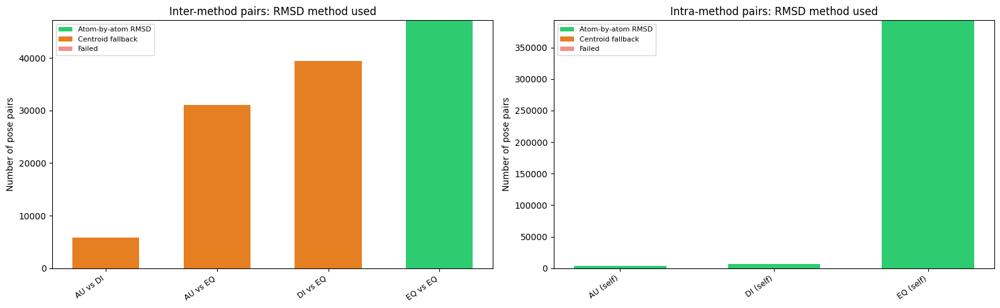


Saved: /home/manndo/master_dev/posebusters_results/clustering_results/rmsd_method_audit.png


In [8]:
"""
RMSD Method Audit — Atom-by-Atom vs Centroid Fallback vs RDKit Best-Fit
=========================================================================
"""

from rdkit.Chem import rdMolAlign


def _load_mol_and_coords(sdf_path):
    try:
        mol = Chem.MolFromMolFile(str(sdf_path), removeHs=True, sanitize=False)
        if mol is None:
            mol = Chem.MolFromMolFile(str(sdf_path), removeHs=False, sanitize=False)
            if mol is not None:
                mol = Chem.RemoveHs(mol)
        if mol is None or mol.GetNumConformers() == 0:
            return None, None
        conf = mol.GetConformer()
        coords = np.array([
            [conf.GetAtomPosition(i).x, conf.GetAtomPosition(i).y, conf.GetAtomPosition(i).z]
            for i in range(mol.GetNumAtoms())
        ])
        return mol, coords
    except Exception:
        return None, None


def classify_rmsd_pair(mol1, coords1, mol2, coords2):
    result = {
        "rmsd_method": "failed", "rdkit_bestfit": False,
        "rmsd_value": np.nan, "rdkit_rmsd": np.nan,
        "n_atoms_1": 0, "n_atoms_2": 0,
    }
    if coords1 is None or coords2 is None:
        return result
    result["n_atoms_1"] = len(coords1)
    result["n_atoms_2"] = len(coords2)

    if len(coords1) == len(coords2):
        d = coords1 - coords2
        result["rmsd_value"] = float(np.sqrt(np.mean(np.sum(d ** 2, axis=1))))
        result["rmsd_method"] = "atom_by_atom"
        if mol1 is not None and mol2 is not None:
            try:
                result["rdkit_rmsd"] = float(rdMolAlign.GetBestRMS(mol1, mol2))
                result["rdkit_bestfit"] = True
            except Exception:
                pass
    else:
        result["rmsd_value"] = float(
            np.linalg.norm(coords1.mean(axis=0) - coords2.mean(axis=0)))
        result["rmsd_method"] = "centroid_fallback"
    return result


# Select data source
if 'df_ward' in dir() and not df_ward.empty:
    df_src = df_ward.copy()
    clust_col = "cluster_ward"
    clust_name = "Ward"
elif 'df_km' in dir() and not df_km.empty:
    df_src = df_km.copy()
    clust_col = "cluster_kmedoids"
    clust_name = "K-Medoids"
else:
    raise RuntimeError("No clustering results found.")

TOOL_ABBREV = {m: m[:2].upper() for m in METHODS_LIST}
combo_list = sorted(df_src.groupby(["protein", "ligand"]).groups.keys())

print(f"Using {clust_name} clustering")
print(f"Poses: {len(df_src)} | Protein-ligand combos: {len(combo_list)}")
print(f"Methods: {METHODS_LIST}")

print("\n" + "=" * 100)
print("SCANNING ALL POSE PAIRS PER CLUSTER...")
print("=" * 100)

pair_records = []
for protein, ligand in combo_list:
    grp = df_src[(df_src["protein"] == protein) & (df_src["ligand"] == ligand)]
    cluster_ids = sorted(grp[clust_col].unique())
    for cid in cluster_ids:
        c_grp = grp[grp[clust_col] == cid]
        pose_cache = {}
        for idx, row in c_grp.iterrows():
            mol, coords = _load_mol_and_coords(row["file_path"])
            pose_cache[idx] = (row["method"], row["pose_rank"], mol, coords, row["file_path"])
        loaded_idxs = [i for i, v in pose_cache.items() if v[3] is not None]
        for i, j in combinations(loaded_idxs, 2):
            m1, r1, mol1, c1, p1 = pose_cache[i]
            m2, r2, mol2, c2, p2 = pose_cache[j]
            pair_type = "inter" if m1 != m2 else "intra"
            res = classify_rmsd_pair(mol1, c1, mol2, c2)
            pair_records.append({
                "protein": protein, "ligand": ligand, "cluster": cid,
                "method_1": TOOL_ABBREV.get(m1, m1), "method_2": TOOL_ABBREV.get(m2, m2),
                "pair_type": pair_type,
                "n_atoms_1": res["n_atoms_1"], "n_atoms_2": res["n_atoms_2"],
                "rmsd_method": res["rmsd_method"], "rmsd_value": res["rmsd_value"],
                "rdkit_bestfit": res["rdkit_bestfit"], "rdkit_rmsd": res["rdkit_rmsd"],
            })

df_audit = pd.DataFrame(pair_records)
print(f"\nTotal pose pairs evaluated: {len(df_audit)}")

# Summaries
print("\n" + "=" * 100)
print("RMSD METHOD BREAKDOWN (all pairs)")
print("=" * 100)

method_counts = df_audit["rmsd_method"].value_counts()
for rm, cnt in method_counts.items():
    pct = 100 * cnt / len(df_audit)
    print(f"  {rm:22s}: {cnt:6d}  ({pct:5.1f}%)")

rdkit_ok = df_audit["rdkit_bestfit"].sum()
print(f"\n  RDKit GetBestRMS succeeded: {rdkit_ok} / {len(df_audit)} "
      f"({100*rdkit_ok/max(len(df_audit),1):.1f}%)")

print("\n" + "=" * 100)
print("RMSD METHOD BY DOCKING-TOOL PAIR")
print("=" * 100)

pair_summary = (
    df_audit
    .groupby(["method_1", "method_2", "pair_type", "rmsd_method"])
    .agg(
        n_pairs=("rmsd_value", "count"),
        mean_rmsd=("rmsd_value", "mean"),
        rdkit_ok=("rdkit_bestfit", "sum"),
        mean_rdkit=("rdkit_rmsd", "mean"),
    )
    .reset_index()
)
pair_summary["mean_rmsd"] = pair_summary["mean_rmsd"].round(2)
pair_summary["mean_rdkit"] = pair_summary["mean_rdkit"].round(2)
pair_summary["rdkit_ok"] = pair_summary["rdkit_ok"].astype(int)
print(pair_summary.to_string(index=False))

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
for ax, pt in zip(axes, ["inter", "intra"]):
    sub = df_audit[df_audit["pair_type"] == pt]
    if sub.empty:
        ax.set_title(f"No {pt}-method pairs"); continue
    sub = sub.copy()
    sub["pair_label"] = sub["method_1"] + " vs " + sub["method_2"]
    if pt == "intra":
        sub["pair_label"] = sub["method_1"] + " (self)"
    labels = sorted(sub["pair_label"].unique())
    atom_counts = [(sub[sub["pair_label"] == l]["rmsd_method"] == "atom_by_atom").sum() for l in labels]
    centroid_counts = [(sub[sub["pair_label"] == l]["rmsd_method"] == "centroid_fallback").sum() for l in labels]
    failed_counts = [(sub[sub["pair_label"] == l]["rmsd_method"] == "failed").sum() for l in labels]
    x = np.arange(len(labels))
    w = 0.6
    ax.bar(x, atom_counts, w, label="Atom-by-atom RMSD", color="#2ecc71")
    ax.bar(x, centroid_counts, w, bottom=atom_counts, label="Centroid fallback", color="#e67e22")
    ax.bar(x, failed_counts, w,
           bottom=[a+c for a, c in zip(atom_counts, centroid_counts)],
           label="Failed", color="#e74c3c", alpha=0.6)
    ax.set_xticks(x); ax.set_xticklabels(labels, rotation=35, ha="right", fontsize=9)
    ax.set_ylabel("Number of pose pairs")
    ax.set_title(f"{'Inter' if pt == 'inter' else 'Intra'}-method pairs: RMSD method used")
    ax.legend(fontsize=8)

plt.tight_layout()
plt.savefig(output_dir / "rmsd_method_audit.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"\nSaved: {output_dir / 'rmsd_method_audit.png'}")

# Cross-Method Cluster RMSD Analysis
For each cluster, select the maximum balanced number of closest poses from each
docking method, compute pairwise cross-method RMSD, and visualise the results
as heatmaps — per cluster, per protein-ligand pair, and across all pairs.

CROSS-METHOD CLUSTER RMSD ANALYSIS  (clustering: Ward)
Protein-ligand combinations: 16

Per-cluster cross-method RMSD (107 clusters):

             protein               ligand  cluster  n_methods        methods  n_poses_per_method  mean_rmsd  median_rmsd  min_rmsd  max_rmsd  std_rmsd
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT        0          2          AU+DI                  13     27.749       25.040    12.183    69.137    12.615
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT        1          2          AU+DI                   4     13.641       14.418     7.608    17.595     3.028
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT        2          3       AU+DI+EQ                   7     16.195       16.315     4.561    37.599     7.424
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT        3          2          AU+DI                   5     25.652       26.665    22.596    27.522     1.731
Orai1WT-MDSnap-Fr300         2abp-nh2-OPT        4          3       AU+DI+EQ                  11     18.020   

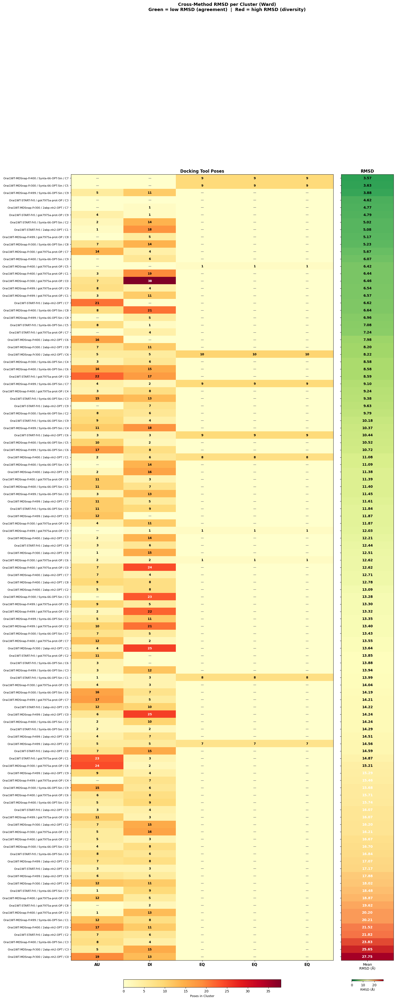

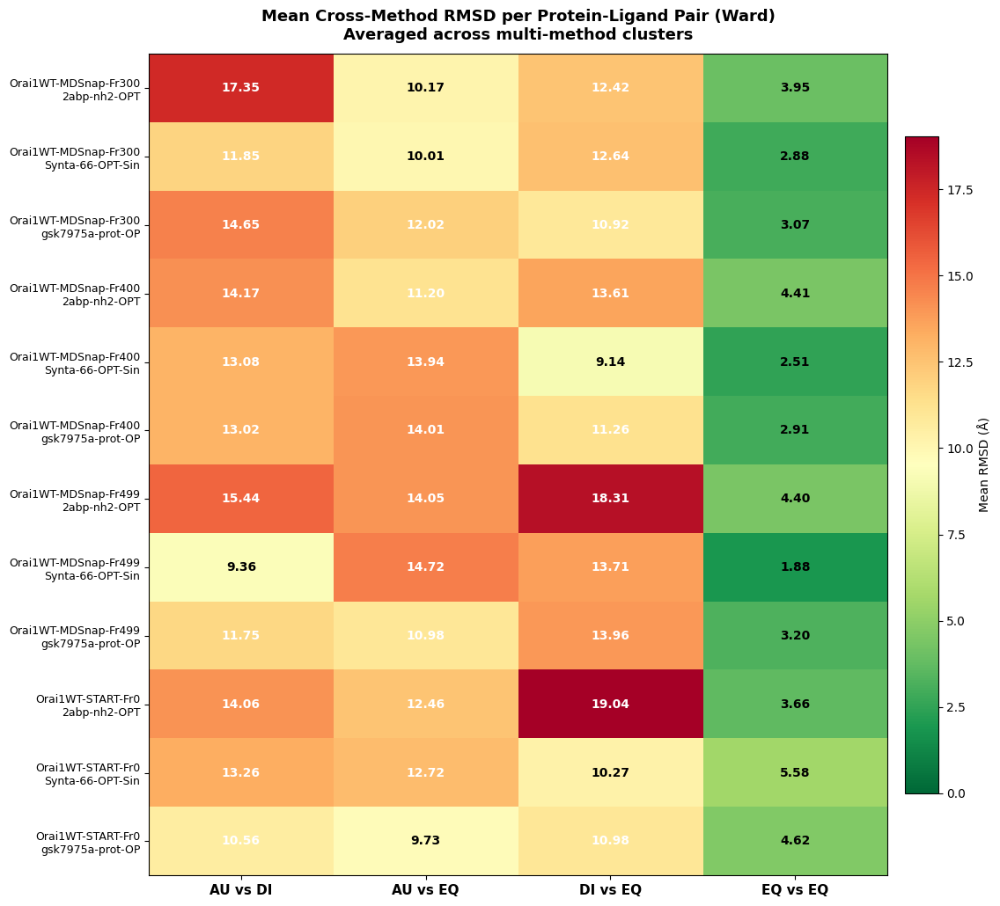

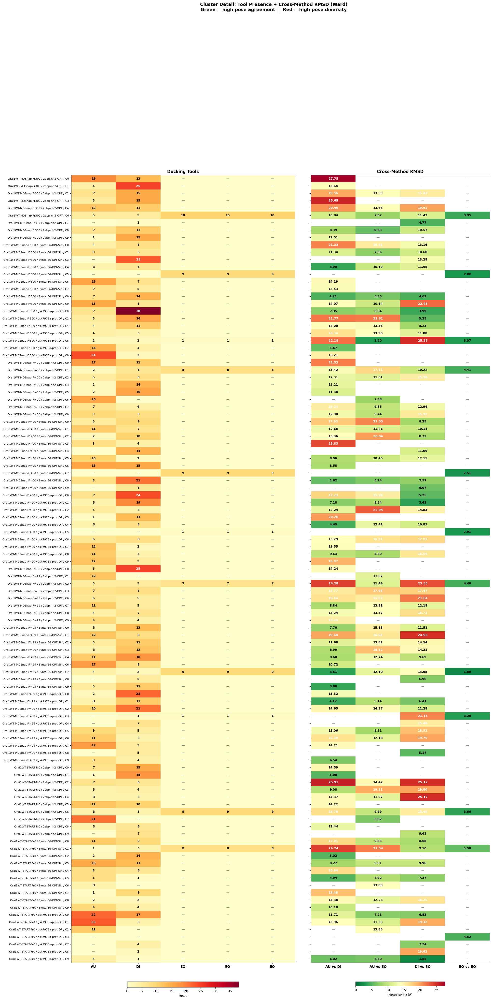


CROSS-METHOD CLUSTER RMSD — SUMMARY
  Clustering method : Ward
  Multi-method clusters analysed : 107
  Protein-ligand combinations    : 12

  Overall cross-method RMSD across all clusters:
    Mean   : 12.325 Å
    Median : 12.010 Å
    Min    : 0.271 Å
    Max    : 69.137 Å

  Clusters with mean RMSD <= 2.0 Å (high agreement) : 0
  Clusters with mean RMSD >  5.0 Å (high diversity)  : 101

  Most-diverse clusters (highest RMSD):
    Orai1WT-MDSnap-Fr300 + 2abp-nh2-OPT C0  (AU+DI, N=13)  mean=27.749 Å
    Orai1WT-MDSnap-Fr300 + 2abp-nh2-OPT C3  (AU+DI, N=5)  mean=25.652 Å
    Orai1WT-MDSnap-Fr400 + Synta-66-OPT-Singlet C3  (AU+DI, N=4)  mean=23.833 Å
    Orai1WT-START-Fr0 + 2abp-nh2-OPT C2  (AU+DI+EQ, N=6)  mean=21.815 Å
    Orai1WT-MDSnap-Fr400 + 2abp-nh2-OPT C0  (AU+DI, N=11)  mean=21.525 Å

  Saved: /home/manndo/master_dev/posebusters_results/clustering_results/cross_method_cluster_rmsd.csv


In [9]:
"""
Cross-Method Cluster RMSD Analysis
=====================================
For each cluster that contains poses from multiple docking methods:
  1. Determine the maximum balanced count N (= min poses across present methods).
  2. From each method, pick the N poses closest to the cluster centroid.
  3. Compute all pairwise cross-method RMSDs among the selected poses.
  4. Record per-cluster statistics and produce heatmaps.
"""
import seaborn as sns
from itertools import combinations

# ---------- helpers (re-use earlier loaders) ----------

def _load_heavy_coords_v2(sdf_path):
    """Return heavy-atom coordinate array or None."""
    try:
        mol = Chem.MolFromMolFile(str(sdf_path), removeHs=True, sanitize=False)
        if mol is None:
            mol = Chem.MolFromMolFile(str(sdf_path), removeHs=False, sanitize=False)
            if mol is not None:
                mol = Chem.RemoveHs(mol)
        if mol is None or mol.GetNumConformers() == 0:
            return None
        conf = mol.GetConformer()
        return np.array([
            [conf.GetAtomPosition(i).x, conf.GetAtomPosition(i).y, conf.GetAtomPosition(i).z]
            for i in range(mol.GetNumAtoms())
        ])
    except Exception:
        return None


def _pairwise_rmsd(c1, c2):
    """Compute RMSD between two coordinate arrays (atom-by-atom or centroid fallback)."""
    if c1 is None or c2 is None:
        return np.nan
    if len(c1) == len(c2):
        d = c1 - c2
        return float(np.sqrt(np.mean(np.sum(d ** 2, axis=1))))
    return float(np.linalg.norm(c1.mean(axis=0) - c2.mean(axis=0)))


# ---------- select clustering source ----------
if 'df_ward' in dir() and not df_ward.empty:
    _df_clust = df_ward.copy()
    _clust_col = "cluster_ward"
    _clust_label = "Ward"
elif 'df_km' in dir() and not df_km.empty:
    _df_clust = df_km.copy()
    _clust_col = "cluster_kmedoids"
    _clust_label = "K-Medoids"
else:
    raise RuntimeError("No clustering results available.")

_TOOL_ABBR = {m: m[:2].upper() for m in METHODS_LIST}

print("=" * 120)
print(f"CROSS-METHOD CLUSTER RMSD ANALYSIS  (clustering: {_clust_label})")
print("=" * 120)

_combo_list = sorted(_df_clust.groupby(["protein", "ligand"]).groups.keys())
print(f"Protein-ligand combinations: {len(_combo_list)}")

# ---------- compute per-cluster cross-method RMSD ----------
cluster_rmsd_rows = []

for protein, ligand in _combo_list:
    grp = _df_clust[(_df_clust["protein"] == protein) & (_df_clust["ligand"] == ligand)]
    cluster_ids = sorted(grp[_clust_col].unique())

    for cid in cluster_ids:
        c_grp = grp[grp[_clust_col] == cid]

        # --- Load coordinates per method ---
        method_coords = {}  # method -> list of (dist_to_centroid, coords)
        cluster_centroid = c_grp[["centroid_x", "centroid_y", "centroid_z"]].mean().values

        for meth in METHODS_LIST:
            m_sub = c_grp[c_grp["method"] == meth].sort_values("pose_rank")
            entries = []
            for _, rw in m_sub.iterrows():
                coords = _load_heavy_coords_v2(rw["file_path"])
                if coords is not None:
                    heavy_centroid = coords.mean(axis=0)
                    dist = float(np.linalg.norm(heavy_centroid - cluster_centroid))
                    entries.append((dist, coords, rw["file_path"], rw["pose_rank"]))
            if entries:
                # Sort by distance to cluster centroid (closest first)
                entries.sort(key=lambda x: x[0])
                method_coords[meth] = entries

        active_methods = sorted(method_coords.keys())
        if len(active_methods) < 2:
            continue

        # Balanced N = min available poses across all present methods
        n_balanced = min(len(method_coords[m]) for m in active_methods)
        if n_balanced == 0:
            continue

        # Keep only the N closest poses per method
        selected = {m: method_coords[m][:n_balanced] for m in active_methods}

        # --- Cross-method pairwise RMSD ---
        all_cross_rmsds = []
        pair_rmsds = {}  # (m1, m2) -> list of rmsd values

        for m1, m2 in combinations(active_methods, 2):
            pair_key = f"{_TOOL_ABBR[m1]} vs {_TOOL_ABBR[m2]}"
            rmsds = []
            for _, c1, _, _ in selected[m1]:
                for _, c2, _, _ in selected[m2]:
                    r = _pairwise_rmsd(c1, c2)
                    if not np.isnan(r):
                        rmsds.append(r)
            pair_rmsds[pair_key] = rmsds
            all_cross_rmsds.extend(rmsds)

        if not all_cross_rmsds:
            continue

        # Per-tool pose counts (all poses in cluster, not just selected)
        tool_pose_counts = {}
        for meth in METHODS_LIST:
            tool_pose_counts[meth] = int((c_grp["method"] == meth).sum())

        row_data = {
            "protein": protein,
            "ligand": ligand,
            "cluster": cid,
            "n_methods": len(active_methods),
            "methods": "+".join(_TOOL_ABBR[m] for m in active_methods),
            "n_poses_per_method": n_balanced,
            "mean_rmsd": round(np.mean(all_cross_rmsds), 3),
            "median_rmsd": round(np.median(all_cross_rmsds), 3),
            "min_rmsd": round(np.min(all_cross_rmsds), 3),
            "max_rmsd": round(np.max(all_cross_rmsds), 3),
            "std_rmsd": round(np.std(all_cross_rmsds), 3),
        }
        # Per-tool pose counts
        for meth in METHODS_LIST:
            row_data[f"n_{_TOOL_ABBR[meth]}"] = tool_pose_counts[meth]
        # Per-pair breakdown
        for pk, rv in pair_rmsds.items():
            if rv:
                row_data[f"mean_{pk}"] = round(np.mean(rv), 3)
                row_data[f"min_{pk}"] = round(np.min(rv), 3)
            else:
                row_data[f"mean_{pk}"] = np.nan
                row_data[f"min_{pk}"] = np.nan

        cluster_rmsd_rows.append(row_data)

df_cluster_rmsd = pd.DataFrame(cluster_rmsd_rows)

if df_cluster_rmsd.empty:
    print("\nNo multi-method clusters found — skipping heatmaps.")
else:
    # Print table
    display_cols = ["protein", "ligand", "cluster", "n_methods", "methods",
                    "n_poses_per_method", "mean_rmsd", "median_rmsd",
                    "min_rmsd", "max_rmsd", "std_rmsd"]
    print(f"\nPer-cluster cross-method RMSD ({len(df_cluster_rmsd)} clusters):\n")
    print(df_cluster_rmsd[display_cols].to_string(index=False))

    # ========================================================================
    # HEATMAP 1: Per-cluster mean cross-method RMSD + tool presence matrix
    # ========================================================================
    df_cluster_rmsd["label"] = (
        df_cluster_rmsd["protein"].str[:22] + " / " +
        df_cluster_rmsd["ligand"].str[:16] + " / C" +
        df_cluster_rmsd["cluster"].astype(str)
    )

    # Sort by mean_rmsd for visual clarity
    df_hm1 = df_cluster_rmsd.sort_values("mean_rmsd", ascending=True).copy()

    # Build tool-count column names
    tool_count_cols = [f"n_{_TOOL_ABBR[m]}" for m in METHODS_LIST]
    tool_col_labels = [_TOOL_ABBR[m] for m in METHODS_LIST]
    n_tool_cols = len(tool_count_cols)

    # Combined matrix: tool pose-count columns + RMSD column
    tool_vals = df_hm1[tool_count_cols].values.astype(float)
    rmsd_vals = df_hm1[["mean_rmsd"]].values
    n_rows_h1 = len(df_hm1)

    cmap_rg = sns.color_palette("RdYlGn_r", as_cmap=True)

    fig_h1, (ax_tools, ax_rmsd) = plt.subplots(
        1, 2,
        figsize=(max(10, n_tool_cols * 1.8 + 8), max(4, n_rows_h1 * 0.45 + 2)),
        gridspec_kw={"width_ratios": [n_tool_cols, 1], "wspace": 0.05},
        sharey=True,
    )

    # Left panel: tool presence / pose-count matrix
    cmap_tools = sns.color_palette("YlOrRd", as_cmap=True)
    tool_max = max(tool_vals.max(), 1)
    im_tools = ax_tools.imshow(tool_vals, cmap=cmap_tools, aspect="auto",
                                vmin=0, vmax=tool_max)
    ax_tools.set_xticks(range(n_tool_cols))
    ax_tools.set_xticklabels(tool_col_labels, fontsize=11, fontweight="bold")
    ax_tools.set_yticks(range(n_rows_h1))
    ax_tools.set_yticklabels(df_hm1["label"].values, fontsize=8)
    for i in range(n_rows_h1):
        for j in range(n_tool_cols):
            v = int(tool_vals[i, j])
            txt = str(v) if v > 0 else "—"
            color = "white" if v > tool_max * 0.6 else ("black" if v > 0 else "gray")
            ax_tools.text(j, i, txt, ha="center", va="center",
                          fontsize=9, fontweight="bold", color=color)
    cbar_t = plt.colorbar(im_tools, ax=ax_tools, shrink=0.6, pad=0.02,
                           orientation="horizontal", location="bottom")
    cbar_t.set_label("Poses in Cluster", fontsize=9)
    ax_tools.set_title("Docking Tool Poses", fontsize=12, fontweight="bold")

    # Right panel: mean cross-method RMSD
    im_rmsd = ax_rmsd.imshow(rmsd_vals, cmap=cmap_rg, aspect="auto",
                              vmin=0, vmax=max(df_hm1["mean_rmsd"].max(), 5))
    ax_rmsd.set_xticks([0])
    ax_rmsd.set_xticklabels(["Mean\nRMSD (Å)"], fontsize=10)
    for i, row in enumerate(df_hm1.itertuples()):
        color = "white" if row.mean_rmsd > rmsd_vals.max() * 0.55 else "black"
        ax_rmsd.text(0, i, f"{row.mean_rmsd:.2f}", ha="center", va="center",
                     fontsize=10, fontweight="bold", color=color)
    cbar_r = plt.colorbar(im_rmsd, ax=ax_rmsd, shrink=0.6, pad=0.02,
                           orientation="horizontal", location="bottom")
    cbar_r.set_label("RMSD (Å)", fontsize=9)
    ax_rmsd.set_title("RMSD", fontsize=12, fontweight="bold")

    fig_h1.suptitle(
        f"Cross-Method RMSD per Cluster ({_clust_label})\n"
        f"Green = low RMSD (agreement)  |  Red = high RMSD (diversity)",
        fontsize=13, fontweight="bold", y=1.02,
    )
    fig_h1.tight_layout()
    fig_h1.savefig(output_dir / "cross_method_rmsd_per_cluster.png",
                   dpi=200, bbox_inches="tight")
    plt.show()

    # ========================================================================
    # HEATMAP 2: Protein-Ligand × Method-Pair mean RMSD
    # ========================================================================
    # Identify all method-pair columns
    pair_mean_cols = [c for c in df_cluster_rmsd.columns if c.startswith("mean_") and " vs " in c]

    if pair_mean_cols:
        # Aggregate per protein-ligand (average across clusters)
        agg_dict = {pc: "mean" for pc in pair_mean_cols}
        agg_dict["mean_rmsd"] = "mean"
        agg_dict["cluster"] = "count"  # number of multi-method clusters
        df_pl_rmsd = (
            df_cluster_rmsd.groupby(["protein", "ligand"])
            .agg(agg_dict)
            .rename(columns={"cluster": "n_clusters"})
            .reset_index()
        )
        df_pl_rmsd["combo"] = (
            df_pl_rmsd["protein"].str[:22] + "\n" + df_pl_rmsd["ligand"].str[:16]
        )

        # Build matrix: rows = protein-ligand, cols = method pairs
        pair_labels = [c.replace("mean_", "") for c in pair_mean_cols]
        heat_matrix = df_pl_rmsd[pair_mean_cols].values
        row_labels = df_pl_rmsd["combo"].values

        fig_h2, ax_h2 = plt.subplots(
            figsize=(max(7, len(pair_labels) * 2.5 + 2),
                     max(4, len(row_labels) * 0.7 + 2))
        )
        im2 = ax_h2.imshow(heat_matrix, cmap=cmap_rg, aspect="auto",
                            vmin=0, vmax=max(np.nanmax(heat_matrix), 5))
        ax_h2.set_xticks(range(len(pair_labels)))
        ax_h2.set_xticklabels(pair_labels, fontsize=11, fontweight="bold")
        ax_h2.set_yticks(range(len(row_labels)))
        ax_h2.set_yticklabels(row_labels, fontsize=9)
        for i in range(heat_matrix.shape[0]):
            for j in range(heat_matrix.shape[1]):
                v = heat_matrix[i, j]
                if np.isnan(v):
                    ax_h2.text(j, i, "—", ha="center", va="center", fontsize=10, color="gray")
                else:
                    color = "white" if v > np.nanmax(heat_matrix) * 0.55 else "black"
                    ax_h2.text(j, i, f"{v:.2f}", ha="center", va="center",
                               fontsize=10, fontweight="bold", color=color)
        cbar2 = plt.colorbar(im2, ax=ax_h2, shrink=0.8, pad=0.02)
        cbar2.set_label("Mean RMSD (Å)", fontsize=10)
        ax_h2.set_title(
            f"Mean Cross-Method RMSD per Protein-Ligand Pair ({_clust_label})\n"
            f"Averaged across multi-method clusters",
            fontsize=13, fontweight="bold", pad=12,
        )
        fig_h2.tight_layout()
        fig_h2.savefig(output_dir / "cross_method_rmsd_per_protlig.png",
                       dpi=200, bbox_inches="tight")
        plt.show()
    else:
        print("  (Only one method pair found — skipping pair-level heatmap)")

    # ========================================================================
    # HEATMAP 3: Full cluster × (tool presence + method-pair RMSD) matrix
    # ========================================================================
    if pair_mean_cols and len(df_cluster_rmsd) > 1:
        df_hm3 = df_cluster_rmsd.sort_values(["protein", "ligand", "cluster"]).copy()
        labels_h3 = df_hm3["label"].values
        n_rows_h3 = len(labels_h3)

        # Tool presence matrix (left) + pair RMSD matrix (right)
        tool_matrix_h3 = df_hm3[tool_count_cols].values.astype(float)
        rmsd_matrix_h3 = df_hm3[pair_mean_cols].values
        n_pair_cols = len(pair_labels)

        fig_h3, (ax3_tools, ax3_rmsd) = plt.subplots(
            1, 2,
            figsize=(max(10, (n_tool_cols + n_pair_cols) * 2 + 4),
                     max(5, n_rows_h3 * 0.45 + 2)),
            gridspec_kw={"width_ratios": [n_tool_cols, n_pair_cols], "wspace": 0.08},
            sharey=True,
        )

        # Left: tool pose counts
        tool_max_h3 = max(tool_matrix_h3.max(), 1)
        im3_t = ax3_tools.imshow(tool_matrix_h3, cmap=cmap_tools, aspect="auto",
                                  vmin=0, vmax=tool_max_h3)
        ax3_tools.set_xticks(range(n_tool_cols))
        ax3_tools.set_xticklabels(tool_col_labels, fontsize=10, fontweight="bold")
        ax3_tools.set_yticks(range(n_rows_h3))
        ax3_tools.set_yticklabels(labels_h3, fontsize=8)
        for i in range(n_rows_h3):
            for j in range(n_tool_cols):
                v = int(tool_matrix_h3[i, j])
                txt = str(v) if v > 0 else "—"
                color = "white" if v > tool_max_h3 * 0.6 else ("black" if v > 0 else "gray")
                ax3_tools.text(j, i, txt, ha="center", va="center",
                               fontsize=9, fontweight="bold", color=color)
        cbar3_t = plt.colorbar(im3_t, ax=ax3_tools, shrink=0.5, pad=0.02,
                                orientation="horizontal", location="bottom")
        cbar3_t.set_label("Poses", fontsize=9)
        ax3_tools.set_title("Docking Tools", fontsize=12, fontweight="bold")

        # Right: per-pair RMSD
        im3_r = ax3_rmsd.imshow(rmsd_matrix_h3, cmap=cmap_rg, aspect="auto",
                                vmin=0, vmax=max(np.nanmax(rmsd_matrix_h3), 5))
        ax3_rmsd.set_xticks(range(n_pair_cols))
        ax3_rmsd.set_xticklabels(pair_labels, fontsize=10, fontweight="bold")
        for i in range(n_rows_h3):
            for j in range(n_pair_cols):
                v = rmsd_matrix_h3[i, j]
                if np.isnan(v):
                    ax3_rmsd.text(j, i, "—", ha="center", va="center", fontsize=9, color="gray")
                else:
                    color = "white" if v > np.nanmax(rmsd_matrix_h3) * 0.55 else "black"
                    ax3_rmsd.text(j, i, f"{v:.2f}", ha="center", va="center",
                                  fontsize=9, fontweight="bold", color=color)
        cbar3_r = plt.colorbar(im3_r, ax=ax3_rmsd, shrink=0.5, pad=0.02,
                                orientation="horizontal", location="bottom")
        cbar3_r.set_label("Mean RMSD (Å)", fontsize=9)
        ax3_rmsd.set_title("Cross-Method RMSD", fontsize=12, fontweight="bold")

        fig_h3.suptitle(
            f"Cluster Detail: Tool Presence + Cross-Method RMSD ({_clust_label})\n"
            f"Green = high pose agreement  |  Red = high pose diversity",
            fontsize=13, fontweight="bold", y=1.02,
        )
        fig_h3.tight_layout()
        fig_h3.savefig(output_dir / "cross_method_rmsd_cluster_x_pair.png",
                       dpi=200, bbox_inches="tight")
        plt.show()

    # ========================================================================
    # SUMMARY STATISTICS
    # ========================================================================
    print("\n" + "=" * 120)
    print("CROSS-METHOD CLUSTER RMSD — SUMMARY")
    print("=" * 120)
    print(f"  Clustering method : {_clust_label}")
    print(f"  Multi-method clusters analysed : {len(df_cluster_rmsd)}")
    print(f"  Protein-ligand combinations    : {df_cluster_rmsd.groupby(['protein','ligand']).ngroups}")
    print(f"\n  Overall cross-method RMSD across all clusters:")
    print(f"    Mean   : {df_cluster_rmsd['mean_rmsd'].mean():.3f} Å")
    print(f"    Median : {df_cluster_rmsd['median_rmsd'].median():.3f} Å")
    print(f"    Min    : {df_cluster_rmsd['min_rmsd'].min():.3f} Å")
    print(f"    Max    : {df_cluster_rmsd['max_rmsd'].max():.3f} Å")

    low_rmsd = df_cluster_rmsd[df_cluster_rmsd["mean_rmsd"] <= 2.0]
    high_rmsd = df_cluster_rmsd[df_cluster_rmsd["mean_rmsd"] > 5.0]
    print(f"\n  Clusters with mean RMSD <= 2.0 Å (high agreement) : {len(low_rmsd)}")
    print(f"  Clusters with mean RMSD >  5.0 Å (high diversity)  : {len(high_rmsd)}")

    if not low_rmsd.empty:
        print(f"\n  Best-agreement clusters (lowest RMSD):")
        for _, r in low_rmsd.nsmallest(5, "mean_rmsd").iterrows():
            print(f"    {r['protein']} + {r['ligand']} C{r['cluster']}  "
                  f"({r['methods']}, N={r['n_poses_per_method']})  "
                  f"mean={r['mean_rmsd']:.3f} Å")

    if not high_rmsd.empty:
        print(f"\n  Most-diverse clusters (highest RMSD):")
        for _, r in high_rmsd.nlargest(5, "mean_rmsd").iterrows():
            print(f"    {r['protein']} + {r['ligand']} C{r['cluster']}  "
                  f"({r['methods']}, N={r['n_poses_per_method']})  "
                  f"mean={r['mean_rmsd']:.3f} Å")

    # Save
    df_cluster_rmsd.to_csv(output_dir / "cross_method_cluster_rmsd.csv", index=False)
    print(f"\n  Saved: {output_dir / 'cross_method_cluster_rmsd.csv'}")

# Cross-Cluster RMSD Overview Across Protein-Ligand Pairs
Aggregate RMSD statistics across all clusters and protein-ligand
combinations to identify which pairs show the most / least agreement
and how RMSD distributes across the full dataset.


CROSS-CLUSTER RMSD OVERVIEW — PROTEIN-LIGAND RANKING  (Ward)
             protein               ligand  n_clusters  n_multi_method_clusters  mean_rmsd_across_clusters  median_rmsd_across_clusters  min_cluster_rmsd  max_cluster_rmsd  std_rmsd_across_clusters  global_min_rmsd  global_max_rmsd  avg_n_methods
   Orai1WT-START-Fr0    gsk7975a-prot-OPT           7                        7                     10.512                        8.591             4.620            19.623                     5.699            0.509           27.681          2.429
Orai1WT-MDSnap-Fr499 Synta-66-OPT-Singlet           9                        9                     11.108                       10.724             3.876            20.210                     4.613            0.785           36.147          2.889
Orai1WT-MDSnap-Fr400 Synta-66-OPT-Singlet          10                       10                     11.169                       10.804             3.568            23.833                     5.794    

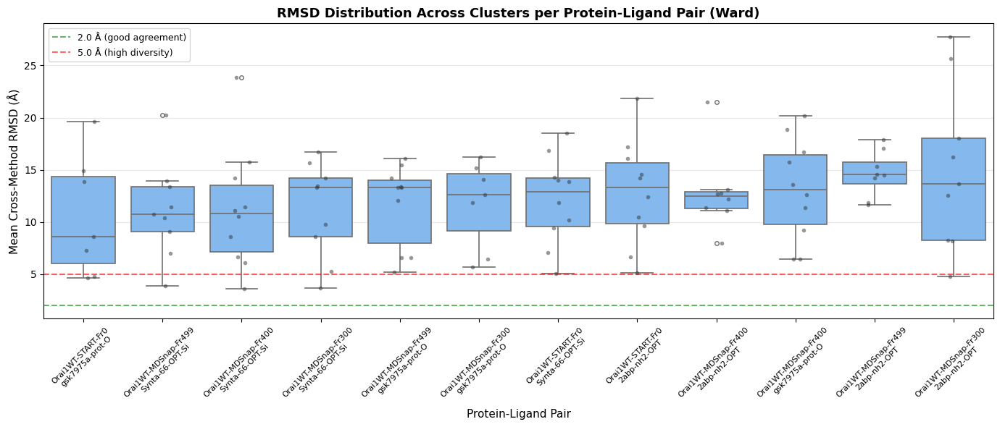

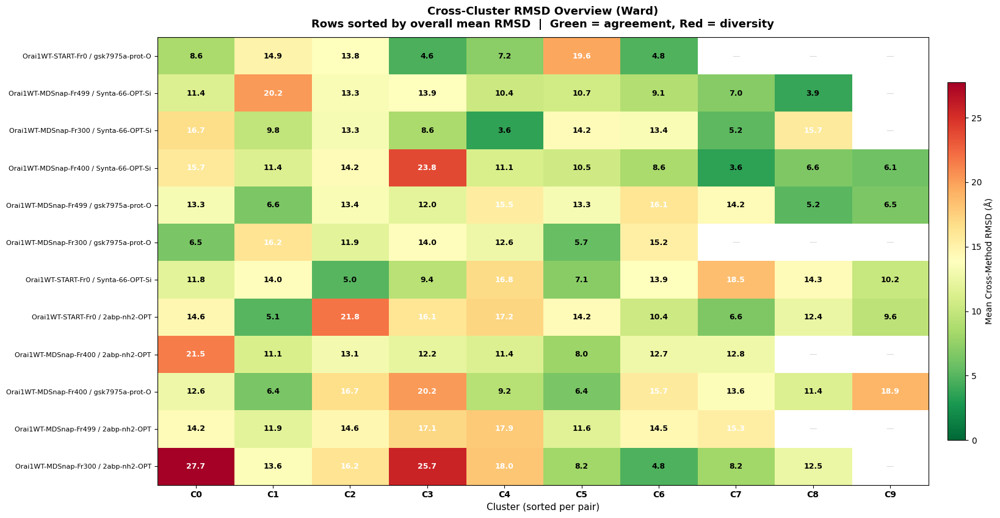

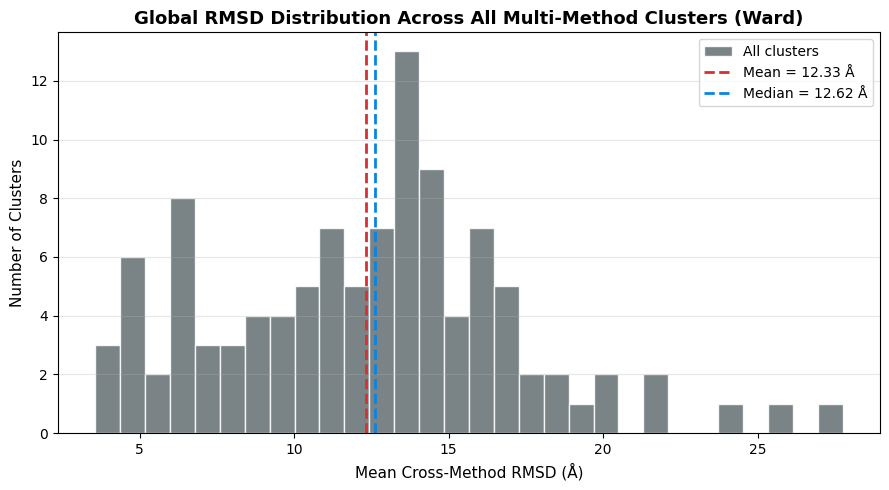


CROSS-CLUSTER RMSD OVERVIEW — GLOBAL SUMMARY  (Ward)
  Protein-ligand pairs analysed       : 12
  Multi-method clusters analysed       : 107
  Overall mean RMSD across clusters    : 12.325 Å
  Overall median RMSD across clusters  : 12.621 Å
  Overall std RMSD across clusters     : 4.859 Å
  Min cluster mean RMSD                : 3.568 Å
  Max cluster mean RMSD                : 27.749 Å
  Clusters with RMSD <= 2 Å            : 0
  Clusters with RMSD 2-5 Å             : 6
  Clusters with RMSD > 5 Å             : 101

  Method-pair global mean RMSD:
    AU vs DI            : 13.344 Å
    AU vs EQ            : 12.372 Å
    DI vs EQ            : 12.913 Å
    EQ vs EQ            : 3.590 Å

  Saved: /home/manndo/master_dev/posebusters_results/clustering_results/rmsd_overview_per_protlig.csv
  Saved: /home/manndo/master_dev/posebusters_results/clustering_results/rmsd_overview_boxplot.png
  Saved: /home/manndo/master_dev/posebusters_results/clustering_results/rmsd_overview_heatmap.png
  Saved:

In [10]:
"""
Cross-Cluster RMSD Overview Across Protein-Ligand Pairs
=========================================================
Provides a bird's-eye view of RMSD behaviour:
  1. Per protein-ligand aggregate (mean, median, min, max, std across clusters).
  2. Ranking of protein-ligand pairs by agreement / diversity.
  3. Box-plot distribution of cluster RMSDs per protein-ligand pair.
  4. Summary heatmap of mean RMSD per protein-ligand pair × cluster.
  5. Global statistics and distribution histogram.
"""

import seaborn as sns


def rmsd_overview_across_clusters(df_cluster_rmsd_in, methods_list, clust_label,
                                  output_dir_path):
    """
    Generate a comprehensive RMSD overview across clusters and protein-ligand
    pairs.

    Parameters
    ----------
    df_cluster_rmsd_in : pd.DataFrame
        Per-cluster cross-method RMSD table (as built in the previous section).
        Must contain columns: protein, ligand, cluster, mean_rmsd, median_rmsd,
        min_rmsd, max_rmsd, std_rmsd, n_methods, methods, n_poses_per_method.
    methods_list : list[str]
        List of docking method names.
    clust_label : str
        Label for the clustering algorithm used (e.g. "Ward", "K-Medoids").
    output_dir_path : Path
        Directory where figures and CSVs are saved.

    Returns
    -------
    df_overview : pd.DataFrame
        Per protein-ligand aggregate RMSD table.
    """

    _TOOL_ABR = {m: m[:2].upper() for m in methods_list}

    # ------------------------------------------------------------------
    # 1. Aggregate per protein-ligand pair
    # ------------------------------------------------------------------
    agg = (
        df_cluster_rmsd_in
        .groupby(["protein", "ligand"])
        .agg(
            n_clusters=("cluster", "nunique"),
            n_multi_method_clusters=("cluster", "count"),  # rows = multi-method
            mean_rmsd_across_clusters=("mean_rmsd", "mean"),
            median_rmsd_across_clusters=("mean_rmsd", "median"),
            min_cluster_rmsd=("mean_rmsd", "min"),
            max_cluster_rmsd=("mean_rmsd", "max"),
            std_rmsd_across_clusters=("mean_rmsd", "std"),
            global_min_rmsd=("min_rmsd", "min"),
            global_max_rmsd=("max_rmsd", "max"),
            avg_n_methods=("n_methods", "mean"),
        )
        .reset_index()
    )
    # Round for readability
    for c in agg.columns:
        if agg[c].dtype == float:
            agg[c] = agg[c].round(3)

    agg = agg.sort_values("mean_rmsd_across_clusters", ascending=True)

    # ------------------------------------------------------------------
    # 2. Print ranked table
    # ------------------------------------------------------------------
    print("\n" + "=" * 130)
    print(f"CROSS-CLUSTER RMSD OVERVIEW — PROTEIN-LIGAND RANKING  ({clust_label})")
    print("=" * 130)
    print(agg.to_string(index=False))

    # Quartile classification
    q1 = agg["mean_rmsd_across_clusters"].quantile(0.25)
    q3 = agg["mean_rmsd_across_clusters"].quantile(0.75)

    print(f"\n  RMSD quartile thresholds: Q1 = {q1:.2f} Å, Q3 = {q3:.2f} Å")

    top_agree = agg[agg["mean_rmsd_across_clusters"] <= q1]
    top_diverse = agg[agg["mean_rmsd_across_clusters"] >= q3]

    if not top_agree.empty:
        print(f"\n  HIGH AGREEMENT (mean RMSD <= Q1 = {q1:.2f} Å):")
        for _, r in top_agree.iterrows():
            print(f"    {r['protein']:<35} + {r['ligand']:<20}  "
                  f"mean={r['mean_rmsd_across_clusters']:.3f} Å  "
                  f"({int(r['n_multi_method_clusters'])} multi-method clusters)")

    if not top_diverse.empty:
        print(f"\n  HIGH DIVERSITY (mean RMSD >= Q3 = {q3:.2f} Å):")
        for _, r in top_diverse.iterrows():
            print(f"    {r['protein']:<35} + {r['ligand']:<20}  "
                  f"mean={r['mean_rmsd_across_clusters']:.3f} Å  "
                  f"({int(r['n_multi_method_clusters'])} multi-method clusters)")

    # ------------------------------------------------------------------
    # 3. Box-plot: cluster RMSD distribution per protein-ligand pair
    # ------------------------------------------------------------------
    combo_order = agg.apply(
        lambda r: f"{r['protein'][:20]}\n{r['ligand'][:15]}", axis=1
    ).values

    df_plot = df_cluster_rmsd_in.copy()
    df_plot["combo"] = (
        df_plot["protein"].str[:20] + "\n" + df_plot["ligand"].str[:15]
    )
    # Enforce sorted order
    df_plot["combo"] = pd.Categorical(df_plot["combo"], categories=combo_order,
                                       ordered=True)

    n_combos_ov = len(combo_order)
    fig_box, ax_box = plt.subplots(
        figsize=(max(10, n_combos_ov * 1.0 + 2), 6)
    )
    sns.boxplot(
        data=df_plot, x="combo", y="mean_rmsd", ax=ax_box,
        color="#74b9ff", linewidth=1.2, fliersize=4,
    )
    sns.stripplot(
        data=df_plot, x="combo", y="mean_rmsd", ax=ax_box,
        color="#2d3436", alpha=0.5, size=4, jitter=0.15,
    )
    ax_box.axhline(y=2.0, color="green", linestyle="--", alpha=0.6,
                    label="2.0 Å (good agreement)")
    ax_box.axhline(y=5.0, color="red", linestyle="--", alpha=0.6,
                    label="5.0 Å (high diversity)")
    ax_box.set_xlabel("Protein-Ligand Pair", fontsize=11)
    ax_box.set_ylabel("Mean Cross-Method RMSD (Å)", fontsize=11)
    ax_box.set_title(
        f"RMSD Distribution Across Clusters per Protein-Ligand Pair ({clust_label})",
        fontsize=13, fontweight="bold",
    )
    ax_box.tick_params(axis="x", rotation=45, labelsize=8)
    ax_box.legend(fontsize=9, loc="upper left")
    ax_box.grid(axis="y", alpha=0.3)
    fig_box.tight_layout()
    fig_box.savefig(output_dir_path / "rmsd_overview_boxplot.png",
                    dpi=200, bbox_inches="tight")
    plt.show()

    # ------------------------------------------------------------------
    # 4. Heatmap: protein-ligand × cluster mean RMSD
    # ------------------------------------------------------------------
    # Pivot: rows = protein-ligand, columns = cluster id, values = mean_rmsd
    df_cluster_rmsd_in["combo_label"] = (
        df_cluster_rmsd_in["protein"].str[:22] + " / " +
        df_cluster_rmsd_in["ligand"].str[:15]
    )
    # Sort combos by overall mean RMSD (ascending)
    combo_mean = (
        df_cluster_rmsd_in.groupby("combo_label")["mean_rmsd"]
        .mean()
        .sort_values()
    )
    sorted_combos = combo_mean.index.tolist()

    # Get all unique cluster IDs per combo → wide-form
    heatmap_rows = []
    max_clusters = 0
    for combo_lbl in sorted_combos:
        sub = df_cluster_rmsd_in[
            df_cluster_rmsd_in["combo_label"] == combo_lbl
        ].sort_values("cluster")
        vals = sub["mean_rmsd"].values
        max_clusters = max(max_clusters, len(vals))
        heatmap_rows.append(vals)

    # Pad so all rows have the same length
    heat_matrix_ov = np.full((len(sorted_combos), max_clusters), np.nan)
    for i, vals in enumerate(heatmap_rows):
        heat_matrix_ov[i, :len(vals)] = vals

    cluster_col_labels = [f"C{j}" for j in range(max_clusters)]

    cmap_rg_ov = sns.color_palette("RdYlGn_r", as_cmap=True)

    fig_hm, ax_hm = plt.subplots(
        figsize=(max(6, max_clusters * 1.5 + 3),
                 max(5, len(sorted_combos) * 0.55 + 2))
    )
    im_hm = ax_hm.imshow(
        heat_matrix_ov, cmap=cmap_rg_ov, aspect="auto",
        vmin=0, vmax=max(np.nanmax(heat_matrix_ov), 5),
    )
    ax_hm.set_xticks(range(max_clusters))
    ax_hm.set_xticklabels(cluster_col_labels, fontsize=10, fontweight="bold")
    ax_hm.set_yticks(range(len(sorted_combos)))
    ax_hm.set_yticklabels(sorted_combos, fontsize=8)
    for i in range(heat_matrix_ov.shape[0]):
        for j in range(heat_matrix_ov.shape[1]):
            v = heat_matrix_ov[i, j]
            if np.isnan(v):
                ax_hm.text(j, i, "—", ha="center", va="center",
                           fontsize=9, color="lightgray")
            else:
                color = "white" if v > np.nanmax(heat_matrix_ov) * 0.55 else "black"
                ax_hm.text(j, i, f"{v:.1f}", ha="center", va="center",
                           fontsize=9, fontweight="bold", color=color)
    cbar_hm = plt.colorbar(im_hm, ax=ax_hm, shrink=0.8, pad=0.02)
    cbar_hm.set_label("Mean Cross-Method RMSD (Å)", fontsize=10)
    ax_hm.set_xlabel("Cluster (sorted per pair)", fontsize=11)
    ax_hm.set_title(
        f"Cross-Cluster RMSD Overview ({clust_label})\n"
        f"Rows sorted by overall mean RMSD  |  Green = agreement, Red = diversity",
        fontsize=13, fontweight="bold", pad=12,
    )
    fig_hm.tight_layout()
    fig_hm.savefig(output_dir_path / "rmsd_overview_heatmap.png",
                   dpi=200, bbox_inches="tight")
    plt.show()

    # ------------------------------------------------------------------
    # 5. Global RMSD histogram
    # ------------------------------------------------------------------
    fig_hist, ax_hist = plt.subplots(figsize=(9, 5))
    ax_hist.hist(
        df_cluster_rmsd_in["mean_rmsd"], bins=30, color="#636e72",
        edgecolor="white", alpha=0.85, label="All clusters",
    )
    ax_hist.axvline(
        df_cluster_rmsd_in["mean_rmsd"].mean(), color="#d63031",
        linestyle="--", linewidth=2,
        label=f"Mean = {df_cluster_rmsd_in['mean_rmsd'].mean():.2f} Å",
    )
    ax_hist.axvline(
        df_cluster_rmsd_in["mean_rmsd"].median(), color="#0984e3",
        linestyle="--", linewidth=2,
        label=f"Median = {df_cluster_rmsd_in['mean_rmsd'].median():.2f} Å",
    )
    ax_hist.set_xlabel("Mean Cross-Method RMSD (Å)", fontsize=11)
    ax_hist.set_ylabel("Number of Clusters", fontsize=11)
    ax_hist.set_title(
        f"Global RMSD Distribution Across All Multi-Method Clusters ({clust_label})",
        fontsize=13, fontweight="bold",
    )
    ax_hist.legend(fontsize=10)
    ax_hist.grid(axis="y", alpha=0.3)
    fig_hist.tight_layout()
    fig_hist.savefig(output_dir_path / "rmsd_overview_histogram.png",
                     dpi=200, bbox_inches="tight")
    plt.show()

    # ------------------------------------------------------------------
    # 6. Global summary statistics
    # ------------------------------------------------------------------
    print("\n" + "=" * 130)
    print(f"CROSS-CLUSTER RMSD OVERVIEW — GLOBAL SUMMARY  ({clust_label})")
    print("=" * 130)
    print(f"  Protein-ligand pairs analysed       : {len(agg)}")
    print(f"  Multi-method clusters analysed       : {len(df_cluster_rmsd_in)}")
    print(f"  Overall mean RMSD across clusters    : "
          f"{df_cluster_rmsd_in['mean_rmsd'].mean():.3f} Å")
    print(f"  Overall median RMSD across clusters  : "
          f"{df_cluster_rmsd_in['mean_rmsd'].median():.3f} Å")
    print(f"  Overall std RMSD across clusters     : "
          f"{df_cluster_rmsd_in['mean_rmsd'].std():.3f} Å")
    print(f"  Min cluster mean RMSD                : "
          f"{df_cluster_rmsd_in['mean_rmsd'].min():.3f} Å")
    print(f"  Max cluster mean RMSD                : "
          f"{df_cluster_rmsd_in['mean_rmsd'].max():.3f} Å")
    print(f"  Clusters with RMSD <= 2 Å            : "
          f"{(df_cluster_rmsd_in['mean_rmsd'] <= 2.0).sum()}")
    print(f"  Clusters with RMSD 2-5 Å             : "
          f"{((df_cluster_rmsd_in['mean_rmsd'] > 2.0) & (df_cluster_rmsd_in['mean_rmsd'] <= 5.0)).sum()}")
    print(f"  Clusters with RMSD > 5 Å             : "
          f"{(df_cluster_rmsd_in['mean_rmsd'] > 5.0).sum()}")

    # Per method-pair global averages
    pair_mean_cols = [c for c in df_cluster_rmsd_in.columns
                      if c.startswith("mean_") and " vs " in c]
    if pair_mean_cols:
        print(f"\n  Method-pair global mean RMSD:")
        for pc in pair_mean_cols:
            label = pc.replace("mean_", "")
            val = df_cluster_rmsd_in[pc].mean()
            print(f"    {label:<20}: {val:.3f} Å")

    # Save aggregate table
    agg.to_csv(output_dir_path / "rmsd_overview_per_protlig.csv", index=False)
    print(f"\n  Saved: {output_dir_path / 'rmsd_overview_per_protlig.csv'}")
    print(f"  Saved: {output_dir_path / 'rmsd_overview_boxplot.png'}")
    print(f"  Saved: {output_dir_path / 'rmsd_overview_heatmap.png'}")
    print(f"  Saved: {output_dir_path / 'rmsd_overview_histogram.png'}")

    return agg


# --- Run the overview ---
if 'df_cluster_rmsd' in dir() and not df_cluster_rmsd.empty:
    df_rmsd_overview = rmsd_overview_across_clusters(
        df_cluster_rmsd_in=df_cluster_rmsd,
        methods_list=METHODS_LIST,
        clust_label=_clust_label,
        output_dir_path=output_dir,
    )
else:
    print("No cross-method cluster RMSD data available — skipping overview.")

print("\n" + "=" * 100)
print("DONE — All clustering and analysis complete.")
print("=" * 100)